##  Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from scipy import stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
from sklearn.cluster import KMeans
import scipy.spatial.distance as dist
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import warnings
warnings.filterwarnings(action="ignore")

pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

## Dataset

In [2]:
df = pd.read_csv('telcom_data.csv')
df.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),HTTP DL (Bytes),HTTP UL (Bytes),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with 125000B < Vol DL,Nb of sec with 1250B < Vol UL < 6250B,Nb of sec with 31250B < Vol DL < 125000B,Nb of sec with 37500B < Vol UL,Nb of sec with 6250B < Vol DL < 31250B,Nb of sec with 6250B < Vol UL < 37500B,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.310000e+19,04-04-2019 12:01,770.0,4/25/19 14:35,662.0,1823652.0,2.082010e+14,3.366496e+10,3.552120e+13,9.16E+15,42.0,5.0,23.0,44.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,37624.0,38787.0,1.823653e+09,Samsung,Samsung Galaxy A5 Sm-A520F,NaN,NaN,NaN,NaN,NaN,NaN,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.310000e+19,04-09-2019 13:04,235.0,4/25/19 8:15,606.0,1365104.0,2.082020e+14,3.368185e+10,3.579400e+13,L77566A,65.0,5.0,16.0,26.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,168.0,3560.0,1.365104e+09,Samsung,Samsung Galaxy J5 (Sm-J530),NaN,NaN,NaN,NaN,NaN,NaN,971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.310000e+19,04-09-2019 17:42,1.0,4/25/19 11:58,652.0,1361762.0,2.082000e+14,3.376063e+10,3.528150e+13,D42335A,NaN,NaN,6.0,9.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,1.361763e+09,Samsung,Samsung Galaxy A8 (2018),NaN,NaN,NaN,NaN,NaN,NaN,751.0,695.0,1684053.0,42224.0,8535055.0,1694064.0,2690151.0,672973.0,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.310000e+19,04-10-2019 00:31,486.0,4/25/19 7:36,171.0,1321509.0,2.082010e+14,3.375034e+10,3.535660e+13,T21824A,NaN,NaN,44.0,44.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,3330.0,37882.0,1.321510e+09,undefined,undefined,NaN,NaN,NaN,NaN,NaN,NaN,17.0,207.0,644121.0,13372.0,9023734.0,2788027.0,1439754.0,631229.0,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.310000e+19,04-12-2019 20:10,565.0,4/25/19 10:40,954.0,1089009.0,2.082010e+14,3.369980e+10,3.540700e+13,D88865A,NaN,NaN,6.0,9.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,1.089009e+09,Samsung,Samsung Sm-G390F,NaN,NaN,NaN,NaN,NaN,NaN,607.0,604.0,862600.0,50188.0,6248284.0,1500559.0,1936496.0,173853.0,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


# Data exploration

In [3]:
df.shape

(150001, 55)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Bearer Id                                 149010 non-null  float64
 1   Start                                     150000 non-null  object 
 2   Start ms                                  150000 non-null  float64
 3   End                                       150000 non-null  object 
 4   End ms                                    150000 non-null  float64
 5   Dur. (ms)                                 150000 non-null  float64
 6   IMSI                                      149431 non-null  float64
 7   MSISDN/Number                             148935 non-null  float64
 8   IMEI                                      149429 non-null  float64
 9   Last Location Name                        148848 non-null  object 
 10  Avg RTT DL (ms)     

In [5]:
df.dtypes

Bearer Id                                   float64
Start                                        object
Start ms                                    float64
End                                          object
End ms                                      float64
Dur. (ms)                                   float64
IMSI                                        float64
MSISDN/Number                               float64
IMEI                                        float64
Last Location Name                           object
Avg RTT DL (ms)                             float64
Avg RTT UL (ms)                             float64
Avg Bearer TP DL (kbps)                     float64
Avg Bearer TP UL (kbps)                     float64
TCP DL Retrans. Vol (Bytes)                 float64
TCP UL Retrans. Vol (Bytes)                 float64
DL TP < 50 Kbps (%)                         float64
50 Kbps < DL TP < 250 Kbps (%)              float64
250 Kbps < DL TP < 1 Mbps (%)               float64
DL TP > 1 Mb

### Null Values

In [6]:
df.isnull().sum()

Bearer Id                                      991
Start                                            1
Start ms                                         1
End                                              1
End ms                                           1
Dur. (ms)                                        1
IMSI                                           570
MSISDN/Number                                 1066
IMEI                                           572
Last Location Name                            1153
Avg RTT DL (ms)                              27829
Avg RTT UL (ms)                              27812
Avg Bearer TP DL (kbps)                          1
Avg Bearer TP UL (kbps)                          1
TCP DL Retrans. Vol (Bytes)                  88146
TCP UL Retrans. Vol (Bytes)                  96649
DL TP < 50 Kbps (%)                            754
50 Kbps < DL TP < 250 Kbps (%)                 754
250 Kbps < DL TP < 1 Mbps (%)                  754
DL TP > 1 Mbps (%)             

In [7]:
#finding the missing value in percentage of each column
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum() / df.shape[0] * 100).round(2).sort_values(ascending=False)
summary = pd.concat([total, percent], axis=1, keys=['Total null value', 'Percentage of null value'])
summary.style.background_gradient(subset=['Percentage of null value'], cmap='coolwarm')

,Total null value,Percentage of null value
Nb of sec with 37500B < Vol UL,130254,86.840000
Nb of sec with 6250B < Vol UL < 37500B,111843,74.560000
Nb of sec with 125000B < Vol DL,97538,65.020000
TCP UL Retrans. Vol (Bytes),96649,64.430000
Nb of sec with 31250B < Vol DL < 125000B,93586,62.390000
Nb of sec with 1250B < Vol UL < 6250B,92894,61.930000
Nb of sec with 6250B < Vol DL < 31250B,88317,58.880000
TCP DL Retrans. Vol (Bytes),88146,58.760000
HTTP UL (Bytes),81810,54.540000
HTTP DL (Bytes),81474,54.320000


In [8]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with 6250B < Vol UL < 37500B',


In [9]:
df.duplicated().sum()

0

In [10]:
#identify garbage value
for i in df.select_dtypes(include='object').columns:
    print(df[i].value_counts())
    print("***"*5)

Start
4/26/19 7:25        203
4/26/19 7:26        190
4/26/19 7:36        175
4/26/19 7:30        160
4/26/19 7:46        143
4/26/19 7:49        138
4/26/19 7:40        135
4/26/19 8:25        135
4/26/19 7:45        133
4/26/19 7:31        132
4/26/19 7:27        132
4/26/19 7:35        130
4/26/19 7:29        130
4/26/19 7:37        129
4/26/19 7:50        126
4/26/19 7:51        126
4/26/19 7:39        125
4/26/19 7:44        124
4/26/19 7:54        124
4/26/19 7:28        120
4/26/19 7:43        120
4/24/19 20:51       118
4/26/19 7:53        118
4/24/19 20:23       117
4/26/19 7:38        115
4/25/19 7:35        115
4/26/19 8:26        114
4/24/19 20:58       114
4/25/19 7:54        113
4/26/19 8:58        112
4/26/19 7:52        112
4/26/19 7:48        112
4/24/19 20:13       111
4/26/19 9:00        109
4/26/19 7:41        109
4/29/19 7:08        109
4/24/19 20:31       109
4/26/19 8:56        108
4/27/19 17:25       108
4/26/19 7:55        108
4/24/19 20:48       108
4/26/19 7:

# Missing Value Treatments

In [11]:
#Replace missing values in Float columns with the "median" of each column.
for i in ["Total DL (Bytes)","Start ms","End ms","Dur. (ms)","Activity Duration DL (ms)","Activity Duration UL (ms)","Avg Bearer TP UL (kbps)","Total UL (Bytes)","Dur. (ms).1","Avg Bearer TP DL (kbps)","IMSI","IMEI","DL TP < 50 Kbps (%)","50 Kbps < DL TP < 250 Kbps (%)","250 Kbps < DL TP < 1 Mbps (%)","DL TP > 1 Mbps (%)","Nb of sec with Vol DL < 6250B","UL TP > 300 Kbps (%)","UL TP < 10 Kbps (%)","10 Kbps < UL TP < 50 Kbps (%)","50 Kbps < UL TP < 300 Kbps (%)","Nb of sec with Vol UL < 1250B","Bearer Id","MSISDN/Number","Avg RTT UL (ms)","Avg RTT DL (ms)","Nb of sec with 37500B < Vol UL","Nb of sec with 6250B < Vol UL < 37500B"
         ,"Nb of sec with 125000B < Vol DL","TCP UL Retrans. Vol (Bytes)","Nb of sec with 31250B < Vol DL < 125000B","Nb of sec with 1250B < Vol UL < 6250B","Nb of sec with 6250B < Vol DL < 31250B","TCP DL Retrans. Vol (Bytes)","HTTP UL (Bytes)","HTTP DL (Bytes)"]:
    df[i].fillna(df[i].median(),inplace= True) 

In [12]:
#Replace missing values in categorical columns with the "mode" of each column
for i in ["Handset Manufacturer","Handset Type","Last Location Name","Start","End"]:
    df[i].fillna(df[i].mode()[0],inplace= True)

In [13]:
df.isnull().sum()

Bearer Id                                   0
Start                                       0
Start ms                                    0
End                                         0
End ms                                      0
Dur. (ms)                                   0
IMSI                                        0
MSISDN/Number                               0
IMEI                                        0
Last Location Name                          0
Avg RTT DL (ms)                             0
Avg RTT UL (ms)                             0
Avg Bearer TP DL (kbps)                     0
Avg Bearer TP UL (kbps)                     0
TCP DL Retrans. Vol (Bytes)                 0
TCP UL Retrans. Vol (Bytes)                 0
DL TP < 50 Kbps (%)                         0
50 Kbps < DL TP < 250 Kbps (%)              0
250 Kbps < DL TP < 1 Mbps (%)               0
DL TP > 1 Mbps (%)                          0
UL TP < 10 Kbps (%)                         0
10 Kbps < UL TP < 50 Kbps (%)     

# Treatments with columns

# Exploratory Data Analysis(EDA)

In [14]:
# finding Descriptive Statistics of dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Bearer Id,150001.0,1.010721e+19,2.877858e+18,6.920000e+18,7.350000e+18,7.350000e+18,1.300000e+19,1.320000e+19
Start ms,150001.0,4.991882e+02,2.886109e+02,0.000000e+00,2.500000e+02,4.990000e+02,7.490000e+02,9.990000e+02
End ms,150001.0,4.988009e+02,2.880967e+02,0.000000e+00,2.510000e+02,5.000000e+02,7.500000e+02,9.990000e+02
Dur. (ms),150001.0,1.046084e+05,8.103736e+04,7.142000e+03,5.744200e+04,8.639900e+04,1.324300e+05,1.859336e+06
IMSI,150001.0,2.082017e+14,2.145202e+10,2.040470e+14,2.082010e+14,2.082020e+14,2.082020e+14,2.140740e+14
MSISDN/Number,150001.0,4.182441e+10,2.438731e+12,3.360100e+10,3.365151e+10,3.366371e+10,3.368307e+10,8.823970e+14
IMEI,150001.0,4.842591e+13,2.238739e+13,4.400150e+11,3.546260e+13,3.572200e+13,8.611970e+13,9.900120e+13
Avg RTT DL (ms),150001.0,9.777445e+01,5.599094e+02,0.000000e+00,3.500000e+01,4.500000e+01,6.200000e+01,9.692300e+04
Avg RTT UL (ms),150001.0,1.531503e+01,7.668800e+01,0.000000e+00,3.000000e+00,5.000000e+00,1.100000e+01,7.120000e+03
Avg Bearer TP DL (kbps),150001.0,1.329996e+04,2.397182e+04,0.000000e+00,4.300000e+01,6.300000e+01,1.971000e+04,3.781600e+05


In [15]:
#object column descriptive statistics
df.describe(include="object").T

,count,unique,top,freq
Start,150001,9997,4/26/19 7:25,204
End,150001,6403,4/25/19 0:01,1151
Last Location Name,150001,45036,9.16E+15,3034
Handset Manufacturer,150001,170,Apple,60137
Handset Type,150001,1396,Huawei B528S-23A,20324


# Outliers Treatments

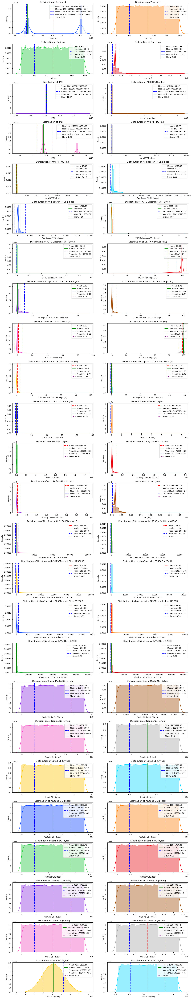

In [16]:
#Here we are checking the data through distplot to see how much each column is skewed
numeric_cols = df.select_dtypes(include=['number']).columns
plt.figure(figsize=(15, 80))
for i, col in enumerate(numeric_cols):
    ax = plt.subplot(len(numeric_cols) // 2 + 1, 2, i + 1)
    
    sns.distplot(df[col], 
                 color=sns.color_palette("bright", len(numeric_cols))[i], 
                 kde=True,
                 ax=ax)
    ax.set_title(f'Distribution of {col}')
    
    mean = df[col].mean()
    std_dev = df[col].std()
    median = df[col].median()
    skewness = df[col].skew()
    
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(median, color='green', linestyle='-', label=f'Median: {median:.2f}')
    ax.axvline(mean + std_dev, color='blue', linestyle='-.', label=f'Mean+Std: {mean + std_dev:.2f}')
    ax.axvline(mean - std_dev, color='blue', linestyle='-.', label=f'Mean-Std: {mean - std_dev:.2f}')
    skew_line = Line2D([], [], color='purple', linestyle=':', label=f'Skew: {skewness:.2f}')
    handles, labels = ax.get_legend_handles_labels()
    handles.append(skew_line)
    labels.append(f'Skew: {skewness:.2f}')
    
    ax.legend(handles=handles, loc='upper right')

plt.tight_layout()
plt.show()

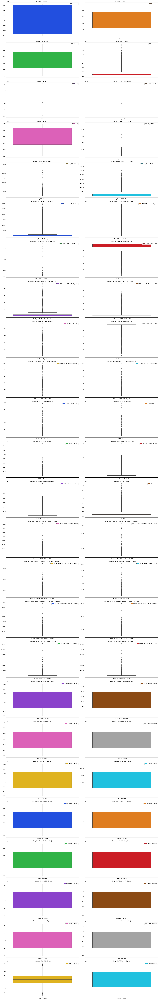

In [17]:
#Here, we have checked for outliers using a boxplot
numeric_cols = df.select_dtypes(include=['number']).columns

num_rows = (len(numeric_cols) + 1) // 2

fig, axes = plt.subplots(ncols=2, nrows=num_rows, figsize=(20, num_rows * 5))
for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df[[col]], ax=axes[i//2][i%2], color=sns.color_palette("bright", len(numeric_cols))[i])
    axes[i//2][i%2].set_title(f'Boxplot of {col}')
    axes[i//2][i%2].legend([col], loc='upper right')
for j in range(len(numeric_cols), num_rows * 2):
    fig.delaxes(axes.flatten()[j])
plt.tight_layout()
plt.show()

In [18]:
# Outliers are capped using the IQR (Interquartile Range) method for each column
# Columns with IQR=0 are skipped to avoid converting all values to zero

import numpy as np

numerical_columns = df.select_dtypes(include=['number']).columns

def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    if IQR == 0:
        print(f"Skipping column '{column}' as it has no variability (IQR=0).")
        return df[column]
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    capped = np.where(df[column] < lower_bound, lower_bound,
                      np.where(df[column] > upper_bound, upper_bound, df[column]))
    print(f"Capped values for column '{column}' using IQR method.")
    return capped.astype(df[column].dtype)

for column in numerical_columns:
    df[column] = cap_outliers(df, column)

print(df.describe())  

Capped values for column 'Bearer Id' using IQR method.
Capped values for column 'Start ms' using IQR method.
Capped values for column 'End ms' using IQR method.
Capped values for column 'Dur. (ms)' using IQR method.
Capped values for column 'IMSI' using IQR method.
Capped values for column 'MSISDN/Number' using IQR method.
Capped values for column 'IMEI' using IQR method.
Capped values for column 'Avg RTT DL (ms)' using IQR method.
Capped values for column 'Avg RTT UL (ms)' using IQR method.
Capped values for column 'Avg Bearer TP DL (kbps)' using IQR method.
Capped values for column 'Avg Bearer TP UL (kbps)' using IQR method.
Skipping column 'TCP DL Retrans. Vol (Bytes)' as it has no variability (IQR=0).
Skipping column 'TCP UL Retrans. Vol (Bytes)' as it has no variability (IQR=0).
Capped values for column 'DL TP < 50 Kbps (%)' using IQR method.
Capped values for column '50 Kbps < DL TP < 250 Kbps (%)' using IQR method.
Capped values for column '250 Kbps < DL TP < 1 Mbps (%)' using I

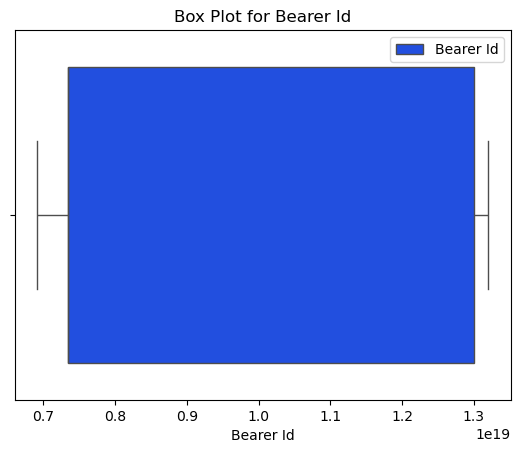

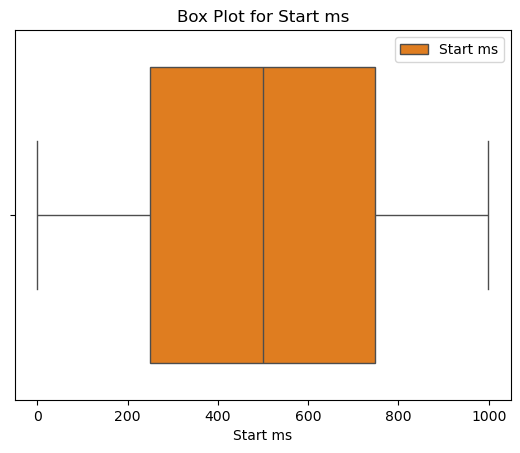

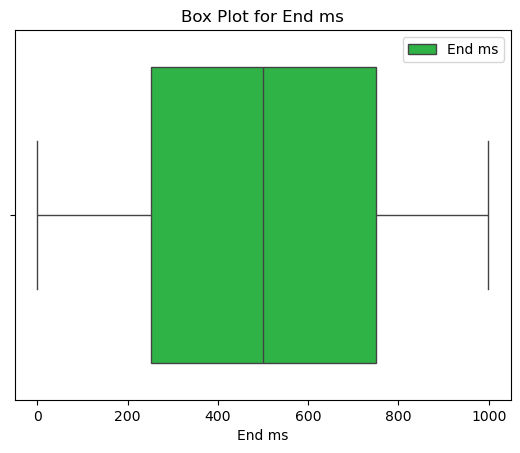

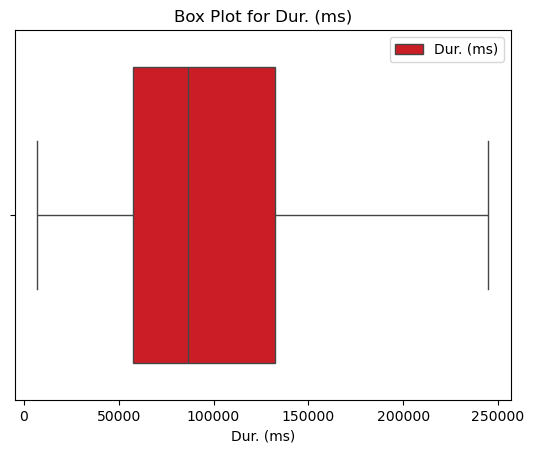

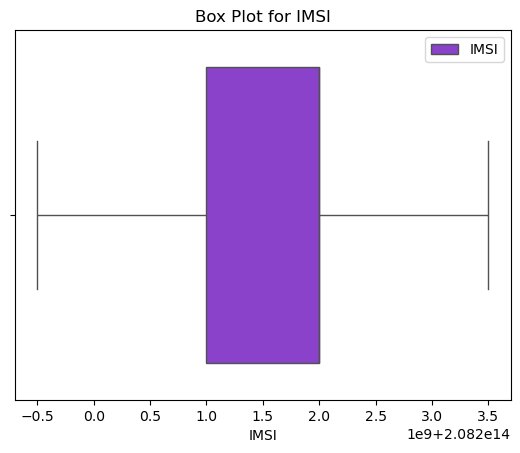

...

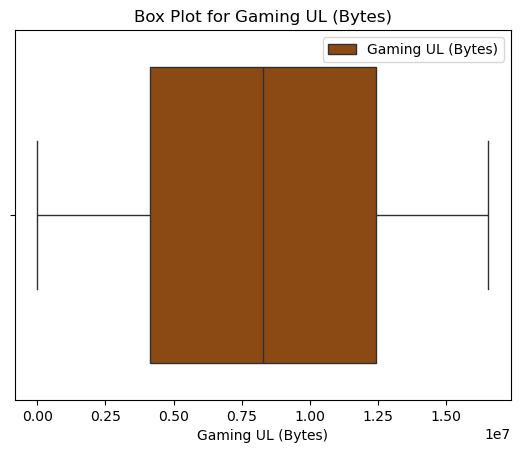

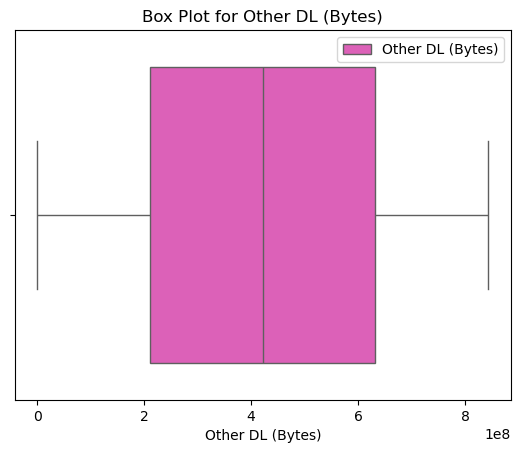

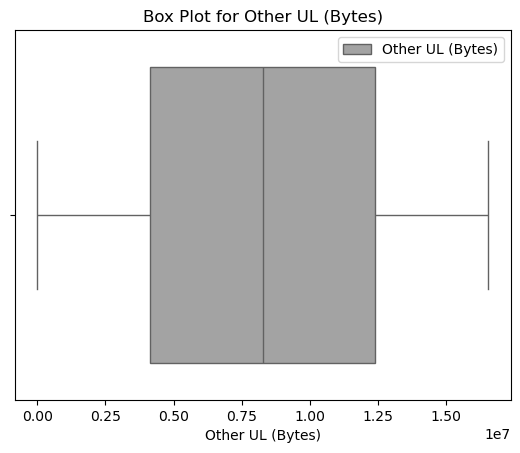

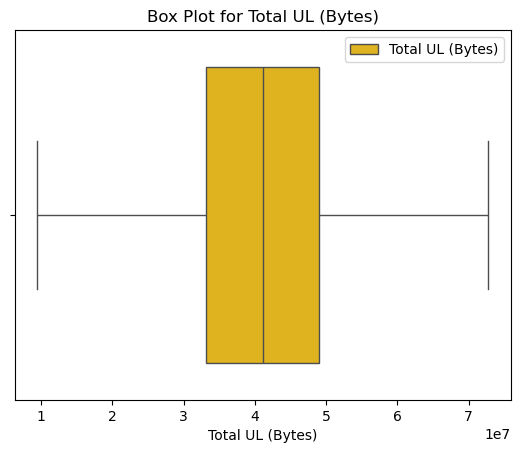

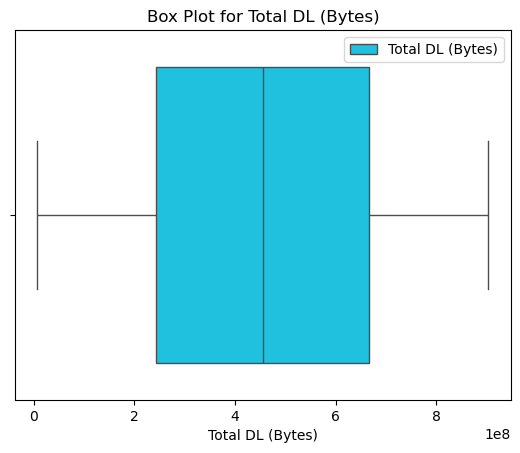

In [19]:
# After capping outliers checking through boxplot 
numeric_columns = df.select_dtypes(include=['number']).columns

colors = sns.color_palette("bright", len(numeric_columns))

for i, column in enumerate(numeric_columns):
    plt.figure()
    sns.boxplot(x=df[column], color=colors[i])
    plt.legend([column], loc='upper right')
    plt.title(f'Box Plot for {column}')
    plt.show()

#                                                 Features Engineer

In [20]:
# create a new features
df['total_bytes'] =  df['Total UL (Bytes)'] + df['Total DL (Bytes)']
df['social_media'] = df['Social Media DL (Bytes)'] + df['Social Media UL (Bytes)']
df['email'] = df['Email DL (Bytes)'] + df['Email UL (Bytes)']
df['google'] = df['Google DL (Bytes)'] + df['Google UL (Bytes)']
df['youtube'] = df['Youtube DL (Bytes)'] + df['Youtube UL (Bytes)']
df['netflix'] = df['Netflix UL (Bytes)'] + df['Netflix DL (Bytes)']
df['gaming'] = df['Gaming DL (Bytes)'] + df['Gaming UL (Bytes)']
df['other'] = df['Other DL (Bytes)'] + df['Other UL (Bytes)']
df['total_tp'] = df['Avg Bearer TP DL (kbps)'] + df['Avg Bearer TP UL (kbps)']
df['total_rtt'] = df['Avg RTT DL (ms)'] + df['Avg RTT UL (ms)']
df['total_tcp'] = df['TCP DL Retrans. Vol (Bytes)'] + df['TCP UL Retrans. Vol (Bytes)']

### Encoding Categorical columns

The method pd.get_dummies() encodes categorical variables using the OneHotEncoder method which is preferred over the LabelEncoder. The latter assigns numerical valuesm to the variable's values hierarchically. This will result to biased data since some entries could be perceived as having more weight than others when the only difference is class type.
Despite the preference of OHE  over LE, the dataset is already big, encoding it with OHE would increase it's size at least twice. Due to computational limitations (memory allocation), LE is used. But always, OHE is a better performer.

In [21]:
columns = [50, 52, 51, 49]
for col in columns:
    x = df.iloc[:, col].values
    x = x.reshape(-1,1)
    encoder = LabelEncoder()
    encoder = encoder.fit(x)
    x = encoder.transform(x)
    name = df.columns[col]
    df[name + '_encoded'] = x

## Task 1. User Overiew Analysis

### Top 10 handsets

In [22]:
top_10_sets = df['Handset Type'].value_counts(ascending = False).head(10)
top_10_sets = pd.DataFrame(top_10_sets)
top_10_sets

,count
Handset Type,
Huawei B528S-23A,20324
Apple iPhone 6S (A1688),9419
Apple iPhone 6 (A1586),9023
undefined,8987
Apple iPhone 7 (A1778),6326
Apple iPhone Se (A1723),5187
Apple iPhone 8 (A1905),4993
Apple iPhone Xr (A2105),4568
Samsung Galaxy S8 (Sm-G950F),4520


In [23]:
df.columns = df.columns.str.strip()

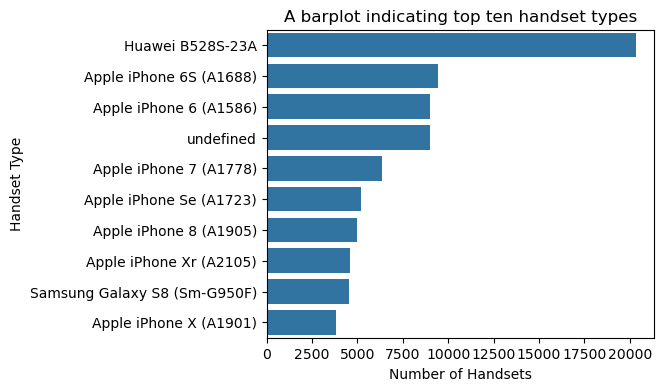

In [24]:
top_10_sets = df['Handset Type'].value_counts().head(10)
plt.figure(figsize=(5,4))
sns.barplot(y=top_10_sets.index, x=top_10_sets.values)
plt.xlabel('Number of Handsets')
plt.ylabel('Handset Type')
plt.title('A barplot indicating top ten handset types')
plt.show()

### Bottom 10 handsets

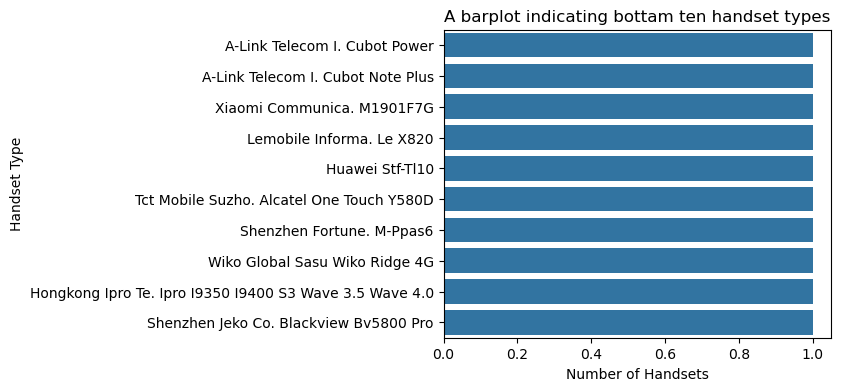

In [25]:
b_10 = df['Handset Type'].value_counts().tail(10)
plt.figure(figsize=(5,4))
sns.barplot(y=b_10.index, x=b_10.values)
plt.xlabel('Number of Handsets')
plt.ylabel('Handset Type')
plt.title('A barplot indicating bottam ten handset types')
plt.show()

### top 3 handset manufacturers

In [26]:
top_3_manufacturers = df['Handset Manufacturer'].value_counts(ascending = False).head(3)
top_3_manufacturers = pd.DataFrame(top_3_manufacturers)
top_3_manufacturers

,count
Handset Manufacturer,
Apple,60137
Samsung,40839
Huawei,34423


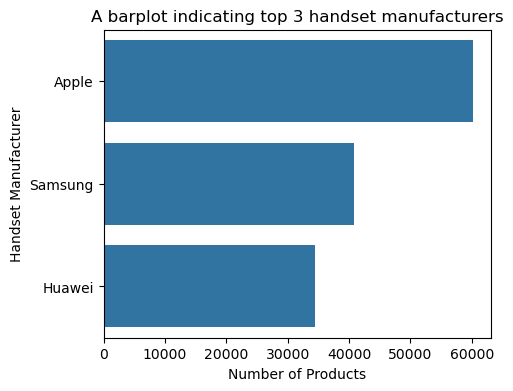

In [27]:
top_3_manufacturers = df['Handset Manufacturer'].value_counts().head(3)
plt.figure(figsize=(5,4))
sns.barplot(y=top_3_manufacturers.index, x=top_3_manufacturers.values) 
plt.xlabel('Number of Products')
plt.ylabel('Handset Manufacturer')
plt.title('A barplot indicating top 3 handset manufacturers')
plt.show()

### Bottom 3 manufacturers

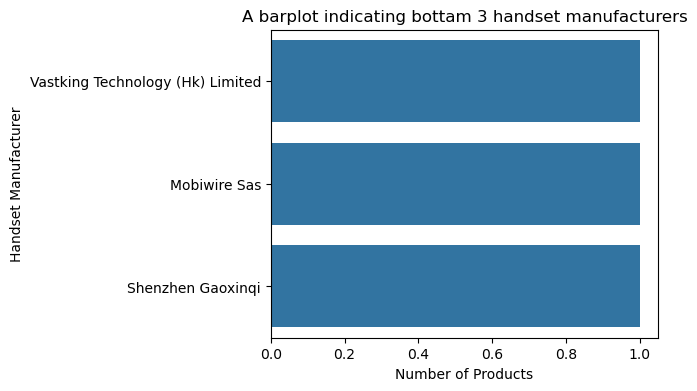

In [28]:
b_3_manufacturers = df['Handset Manufacturer'].value_counts().tail(3)
plt.figure(figsize=(5,4))
sns.barplot(y=b_3_manufacturers.index, x=b_3_manufacturers.values) 
plt.xlabel('Number of Products')
plt.ylabel('Handset Manufacturer')
plt.title('A barplot indicating bottam 3 handset manufacturers')
plt.show()

###  top 5 handsets per handset manufacturer

In [29]:
a = df.groupby(['Handset Manufacturer', 'Handset Type']).size().reset_index(name = 'count').sort_values(['Handset Manufacturer', 'count'], ascending = False).groupby('Handset Manufacturer').head(5)
a.tail(10)

,Handset Manufacturer,Handset Type,count
7,ASUSTeK,Asustek Asus Zb552Kl Zenfone Go,7
12,ASUSTeK,Asustek Asus Zenfone2 Laser Ze600Kl,5
13,ASUSTeK,Asustek Asus Zenfone2 Laser Ze601Kl,4
9,ASUSTeK,Asustek Asus Zenfone 2 Laser Ze500Kl,3
10,ASUSTeK,Asustek Asus Zenfone Selfie Zd551Kl,2
6,A-Link Telecom International Co Limited,A-Link Telecom I. Cubot X18 Plus,2
0,A-Link Telecom International Co Limited,A-Link Telecom I. Cubot A5,1
1,A-Link Telecom International Co Limited,A-Link Telecom I. Cubot Note Plus,1
2,A-Link Telecom International Co Limited,A-Link Telecom I. Cubot Note S,1
3,A-Link Telecom International Co Limited,A-Link Telecom I. Cubot Nova,1


### Make a short interpretation and recommendation to marketing teams

* Apple, Huawei and Samsung are the leading manufacturers. The top 10 handsets also are manufactured by these companies. Some of the bottom 10 handsets also belong to these manufacturers. Thus the volume of the most common handsets should be increased to replace the least common sets. 
* Products from the bottom 3 manufacturers should no longer be stocked. Their extremely small volume matches small profit percentage in comparison to other manufacturers.

### Aggregate per user the following information in the column:

1.  number of xDR sessions

In [30]:
xdr_sess = df[['Bearer Id', 'MSISDN/Number']]
a = xdr_sess.groupby('MSISDN/Number').count()
a.columns = ['xdr sessions']
a.head()

,xdr sessions
MSISDN/Number,
3.360416e+10,1631
3.360417e+10,1
3.360417e+10,2
3.360418e+10,1
3.360418e+10,1


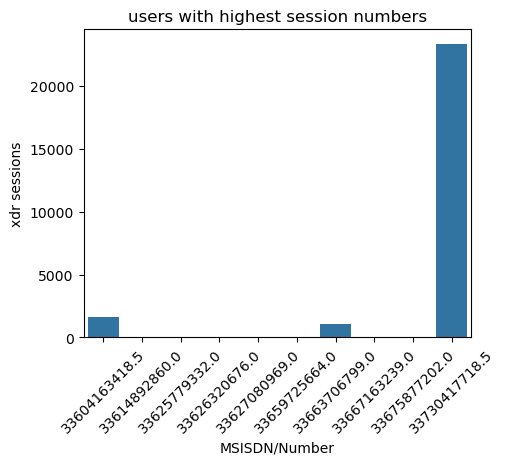

In [31]:
t = a.sort_values(by = 'xdr sessions', ascending = False).head(10)
plt.figure(figsize=(5,4))
sns.barplot(x = t.index, y = t['xdr sessions'])
plt.xticks(rotation = 45)
plt.title('users with highest session numbers')
plt.show()

2.  Session duration

In [32]:
duration = df[['Dur. (ms)', 'MSISDN/Number']]
b = duration.groupby('MSISDN/Number').sum()
b.columns = ['sess_duration (ms)']
b.head()

,sess_duration (ms)
MSISDN/Number,
3.360416e+10,157869435.0
3.360417e+10,58922.0
3.360417e+10,212989.0
3.360418e+10,127367.0
3.360418e+10,45126.0


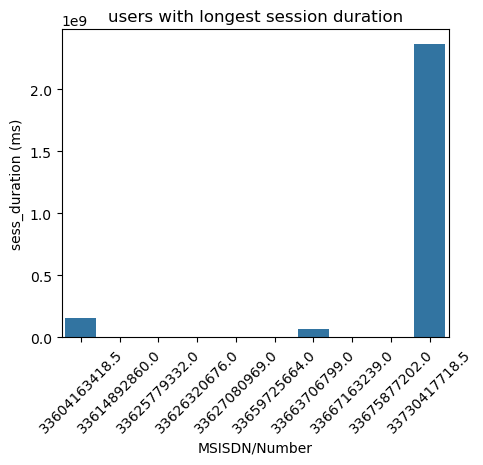

In [33]:
t = b.sort_values(by = 'sess_duration (ms)', ascending = False).head(10)
plt.figure(figsize=(5,4))
sns.barplot(x = t.index, y = t['sess_duration (ms)'])
plt.xticks(rotation = 45)
plt.title('users with longest session duration')
plt.show()

In [34]:
byte = df[['MSISDN/Number', 'Total UL (Bytes)', 'Total DL (Bytes)', 'total_bytes']]
c = byte.groupby('MSISDN/Number').sum()
c.head()

,Total UL (Bytes),Total DL (Bytes),total_bytes
MSISDN/Number,,,
3.360416e+10,6.660241e+10,7.432310e+11,8.098334e+11
3.360417e+10,4.307210e+07,5.292440e+08,5.723161e+08
3.360417e+10,6.479081e+07,9.034510e+08,9.682418e+08
3.360418e+10,3.793038e+07,7.154997e+08,7.534301e+08
3.360418e+10,4.454165e+07,2.278016e+08,2.723432e+08


4. The total data volume (in Bytes) during this session for each application

In [35]:
# I had already created total bytes columns for all the applications.
apps = df[['MSISDN/Number','social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other']]
d = apps.groupby('MSISDN/Number').sum()
d.head()

,social_media,google,email,youtube,netflix,gaming,other
MSISDN/Number,,,,,,,
3.360416e+10,2.971681e+09,1.278469e+10,3.704599e+09,3.651438e+10,3.640115e+10,7.040380e+11,6.842803e+11
3.360417e+10,9.188010e+05,4.362016e+06,2.299860e+06,1.954621e+07,2.755807e+07,5.132055e+08,2.212550e+08
3.360417e+10,2.214142e+06,1.153093e+07,4.457470e+06,3.353502e+07,2.438497e+07,8.778847e+08,1.086051e+09
3.360418e+10,3.451216e+06,3.368250e+05,3.931763e+06,9.879322e+06,3.458355e+07,6.953183e+08,2.068831e+08
3.360418e+10,2.538148e+06,7.159353e+06,3.871069e+06,2.779988e+07,1.903087e+07,2.009846e+08,8.461103e+08


## Non-Graphical Univariate Analysis

Variables of interest: Number of xDR sessions,  Session duration,  the total download (DL) and upload (UL) data , the total data volume (in Bytes) during this session for each application (Social Media, Google, Email, YouTube, Netflix, Gaming).

### Dispersion and Central Tendency

In [36]:
variables = df[['Bearer Id', 'Dur. (ms).1', 'Total UL (Bytes)', 'Total DL (Bytes)', 'social_media', 'netflix',
                  'gaming', 'youtube', 'google', 'email', 'other', 'Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)',
                 'Avg Bearer TP UL (kbps)', 'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)']]
variables.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Bearer Id,150001.0,1.010721e+19,2.877858e+18,6.920000e+18,7.350000e+18,7.350000e+18,1.300000e+19,1.320000e+19
Dur. (ms).1,150001.0,9.957261e+07,5.908432e+07,7.142988e+06,5.744206e+07,8.639998e+07,1.324307e+08,2.449136e+08
Total UL (Bytes),150001.0,4.112120e+07,1.126923e+07,9.503716e+06,3.322203e+07,4.114331e+07,4.903424e+07,7.275255e+07
Total DL (Bytes),150001.0,4.546434e+08,2.441421e+08,7.114041e+06,2.431072e+08,4.558411e+08,6.657051e+08,9.029696e+08
social_media,150001.0,1.828250e+06,1.035646e+06,1.563000e+03,9.322180e+05,1.826471e+06,2.727487e+06,3.650861e+06
netflix,150001.0,2.262861e+07,9.260820e+06,9.843200e+04,1.597946e+07,2.263554e+07,2.929044e+07,4.519815e+07
gaming,150001.0,4.303331e+08,2.440199e+08,3.063580e+05,2.187279e+08,4.316150e+08,6.414159e+08,8.592028e+08
youtube,150001.0,2.264348e+07,9.246800e+06,7.890300e+04,1.599846e+07,2.266177e+07,2.929260e+07,4.519008e+07
google,150001.0,7.807295e+06,3.516420e+06,4.033000e+04,4.943599e+06,7.812835e+06,1.068280e+07,1.552878e+07
email,150001.0,2.259102e+06,1.071109e+06,8.359000e+03,1.359344e+06,2.263567e+06,3.159818e+06,4.518036e+06


In [37]:
df['Bearer Id'].nunique()

9

In [38]:
# skewness and kurtosis
s = variables.skew(axis = 0, skipna = True) 
k = variables.kurt(axis = 0, skipna = True) 
pd.DataFrame([s, k], index = ['skewness', 'kurtosis'])

,Bearer Id,Dur. (ms).1,Total UL (Bytes),Total DL (Bytes),social_media,netflix,gaming,youtube,google,email,other,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes)
skewness,0.039843,0.812711,-0.002464,-0.003153,-0.002121,-0.000409,-0.003225,-0.005465,-0.010602,-0.006033,0.001256,0.946339,1.123653,1.281268,1.230097,24.875258,141.019902
kurtosis,-1.994093,0.167584,-0.342284,-1.198363,-1.202178,-0.608472,-1.202256,-0.604624,-0.963035,-1.061696,-1.196015,-0.124476,-0.221272,0.070830,-0.137680,697.560485,21908.803983


Summary of some of the variables:


1. **Bearer Id** ~ This is the session identifier, thus not quantitative. It has 134709 instances thus the recorded number of xDR sessions are 134709.
2. **Dur. (ms).1** ~ This is the total duration of an xDR session in micro seconds. Across the 134709 sessions, it has the following measures:
    * Average:          	1.046091e+08
    * Standard Deviation: 	8.103734e+07
    * Minimum Value:     	7.142988e+06 	
    * Lower Quartile    	5.744206e+07 	
    * Median            	8.639998e+07 	 
    * Upper Quartile     	1.324307e+08
    * Maximum Value:    	1.859336e+09 		
    
    
3. **Total UL (Bytes)** ~ Data volume in bytes sent during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	4.112121e+07
    * Standard Deviation: 	1.127635e+07  
    * Minimum Value:     	2.866892e+06 
    * Lower Quartile    	3.322203e+07 
    * Median            	4.558409e+08
    * Upper Quartile     	4.903424e+07 
    * Maximum Value:    	7.833131e+07 
    
    
4. **Total DL (Bytes)** ~ Data volume in bytes received during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	4.546434e+085
    * Standard Deviation: 	2.441421e+08 
    * Minimum Value:     	7.114041e+06 
    * Lower Quartile    	2.431072e+08 
    * Median            	1.826471e+06 
    * Upper Quartile     	6.657051e+08 
    * Maximum Value:    	9.029696e+08  
    
    
5. **social_media** ~ Total social media data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	1.828250e+06
    * Standard Deviation: 	1.035646e+06
    * Minimum Value:     	1.563000e+03
    * Lower Quartile    	9.322180e+05
    * Median            	8.639900e+04
    * Upper Quartile     	2.727487e+06 
    * Maximum Value:    	3.650861e+06 
   
   
   
6. **netflix** ~ Total netflix data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	2.262861e+07 
    * Standard Deviation: 	9.260820e+06 
    * Minimum Value:     	9.843200e+04 
    * Lower Quartile    	1.597946e+07
    * Median            	2.263554e+07 
    * Upper Quartile     	2.929044e+07 
    * Maximum Value:    	4.519815e+07 
    
    
7. **gaming** ~ Total gaming data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	4.303331e+08 
    * Standard Deviation: 	2.440199e+08 
    * Minimum Value:     	3.063580e+05
    * Lower Quartile    	2.187279e+08
    * Median            	4.316150e+08 
    * Upper Quartile     	6.414159e+08 
    * Maximum Value:    	8.592028e+08 
    
    
8. **youtube)** ~ Total youtube data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	2.264348e+07 
    * Standard Deviation: 	9.246800e+06 
    * Minimum Value:     	7.890300e+04
    * Lower Quartile    	1.599846e+07 
    * Median            	2.266177e+07
    * Upper Quartile     	2.929260e+07
    * Maximum Value:    	4.519008e+07 
    
    
9. **email** ~ Total email data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	2.259102e+06 
    * Standard Deviation: 	1.071109e+06 
    * Minimum Value:     	8.359000e+03 
    * Lower Quartile    	1.359344e+06
    * Median            	2.263567e+06
    * Upper Quartile     	3.159818e+06 
    * Maximum Value:    	4.518036e+06
    
    
10. **google** ~ Total google data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	7.807295e+06 
    * Standard Deviation: 	3.516420e+06 
    * Minimum Value:     	4.033000e+04 
    * Lower Quartile    	4.943599e+06 
    * Median            	7.812835e+06
    * Upper Quartile     	1.068280e+07 
    * Maximum Value:    	1.552878e+07 
    
    
    
11. **other** ~ Total Other data volume sent and received by the MS during this session. Across the 134709 sessions, it has the following measures:
    * Average:          	4.293653e+08
    * Standard Deviation: 	2.432681e+08
    * Minimum Value:     	1.490450e+05
    * Lower Quartile    	2.185534e+08
    * Median            	4.299865e+08
    * Upper Quartile     	6.399275e+08
    * Maximum Value:    	8.595209e+08



## Graphical Univariate Analysis.

Variables of interest: Number of xDR sessions, Session duration, the total download (DL) and upload (UL) data , the total data volume (in Bytes) during this session for each application (Social Media, Google, Email, YouTube, Netflix, Gaming).

For graphical analysis of univariate categorical data, histograms are typically used. The histogram represents the frequency (count) or proportion (count/total count) of cases for a range of values. Typically, between about 5 and 30 bins are chosen. Histograms are one of the best ways to quickly learn a lot about your data, including central tendency, spread, modality, shape and outliers. Stem and Leaf plots could also be used for the same purpose. Boxplots can also be used to present  information about the central tendency, symmetry and skew, as well as outliers.  Quantile normal plots or QQ plots and other techniques could also be used here.

Number of xDR sessions,  Session duration,  the total download (DL) and upload (UL) data , the total data volume (in Bytes) during this session for each application (Social Media, Google, Email, YouTube, Netflix, Gaming).


 mu = 430333100.71 and sigma = 244019110.62



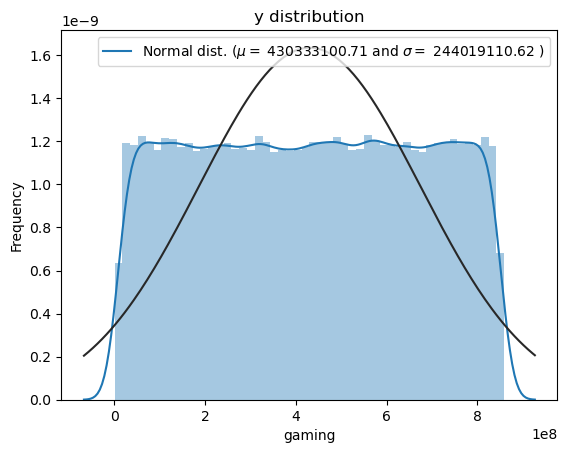

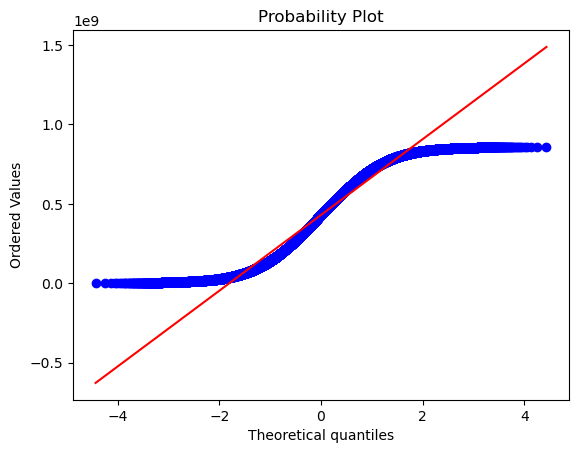

In [39]:
sns.distplot(df['gaming'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['gaming'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['gaming'], plot=plt)
plt.show()


 mu = 22628606.54 and sigma = 9260789.22



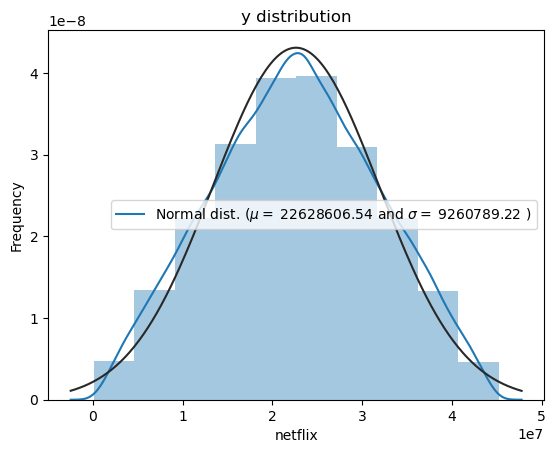

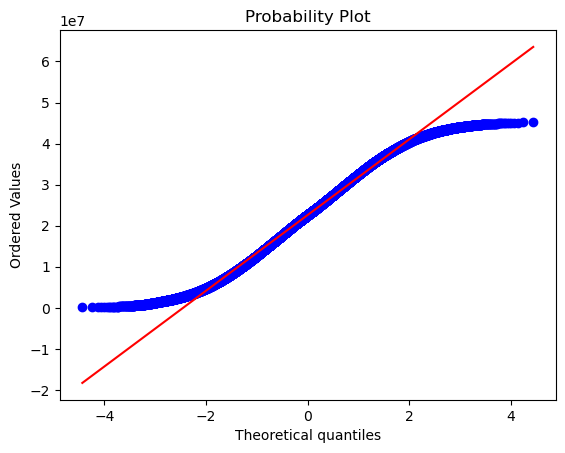

In [40]:
# sns.distplot(data['Social Media DL (Bytes)']) # numeric
sns.distplot(df['netflix'] , bins = 10, fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['netflix'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['netflix'], plot=plt)
plt.show()


 mu = 22643482.64 and sigma = 9246769.48



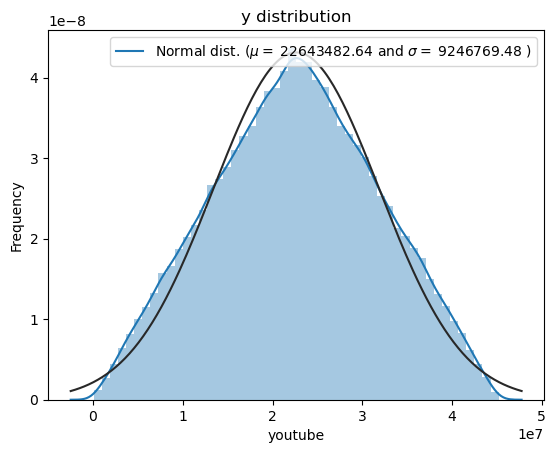

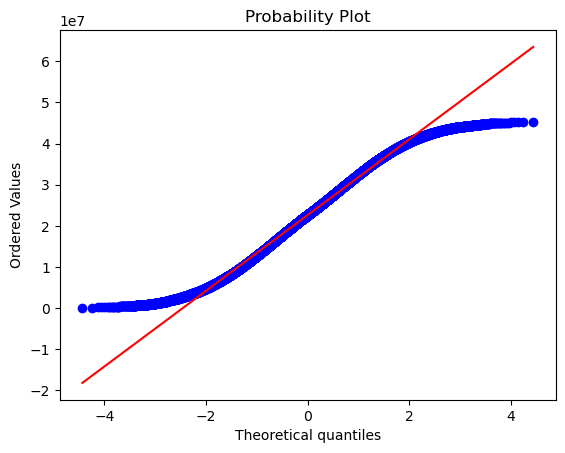

In [41]:
# sns.distplot(data['Social Media DL (Bytes)']) # numeric
sns.distplot(df['youtube'] , fit=norm)
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['youtube'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['youtube'], plot=plt)
plt.show()


 mu = 2259102.31 and sigma = 1071105.49



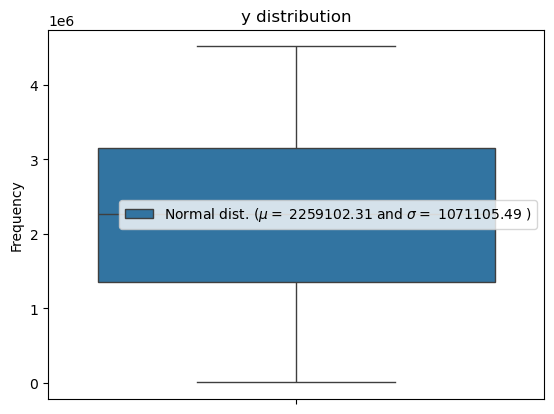

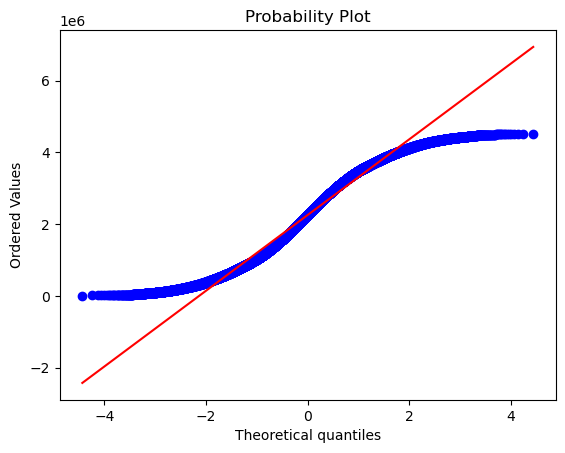

In [42]:
# sns.distplot(data['email'], fit = norm) # numeric
sns.boxplot(df['email'])
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['email'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['email'], plot=plt)
plt.show()


 mu = 7807294.55 and sigma = 3516408.52



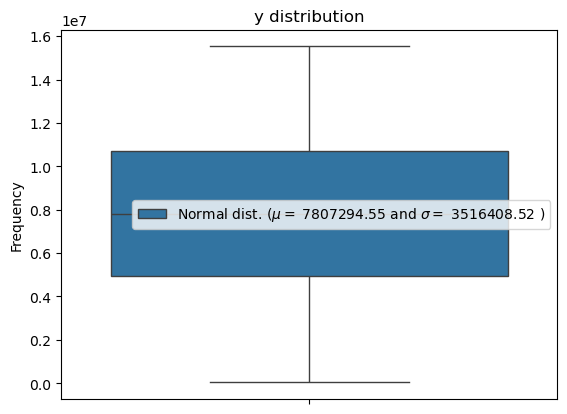

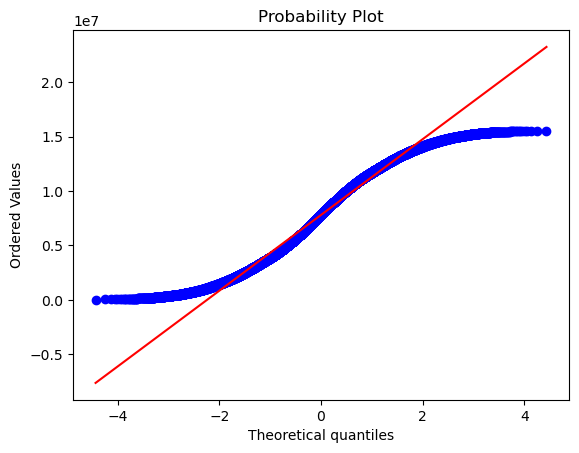

In [43]:
# sns.distplot(data['Social Media DL (Bytes)']) # numeric
# sns.distplot(data['google'] , fit=norm);
sns.boxplot(df['google'])
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['google'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['google'], plot=plt)
plt.show()


 mu = 1828250.21 and sigma = 1035642.69



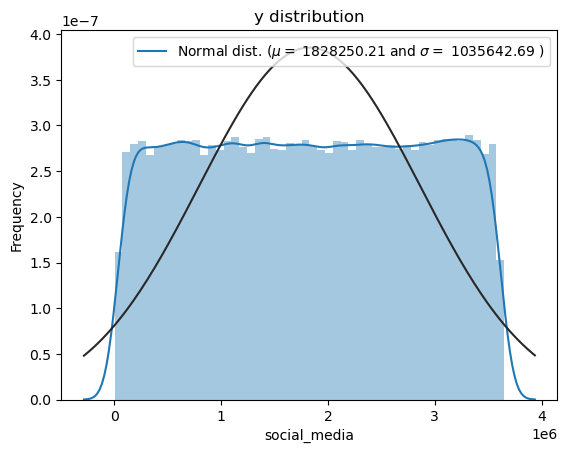

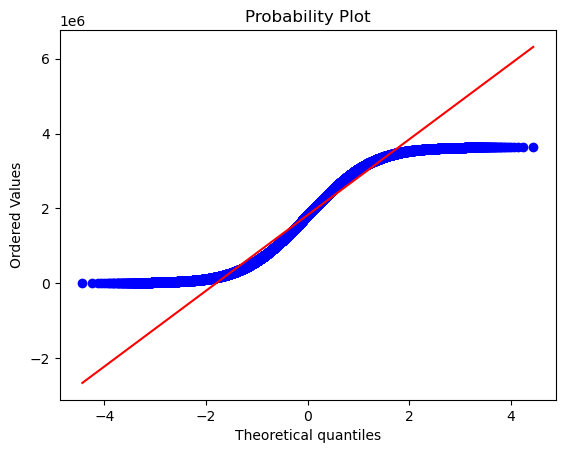

In [44]:
# sns.distplot(df['Social Media DL (Bytes)']) # numeric
sns.distplot(df['social_media'] , fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['social_media'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['social_media'], plot=plt)
plt.show()


 mu = 495764638.97 and sigma = 244379803.37



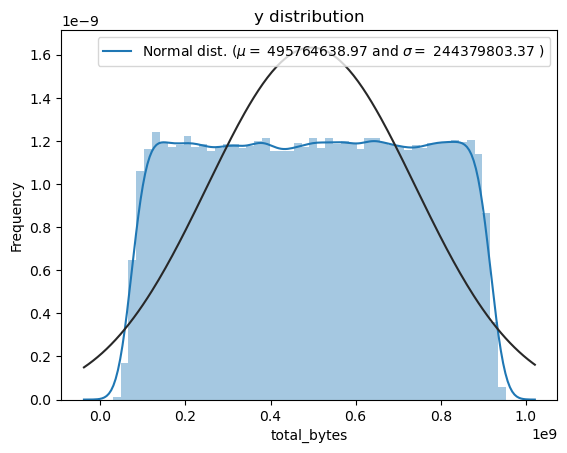

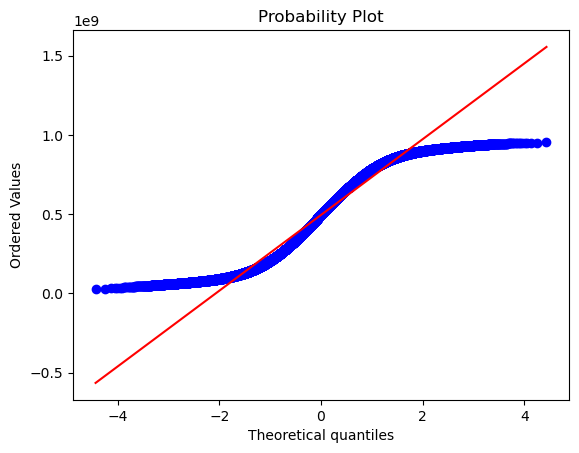

In [45]:
# total upload and download bytes
sns.distplot(df['total_bytes'] , fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['total_bytes'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['total_bytes'], plot=plt)
plt.show()


 mu = 99572606.75 and sigma = 59084118.13



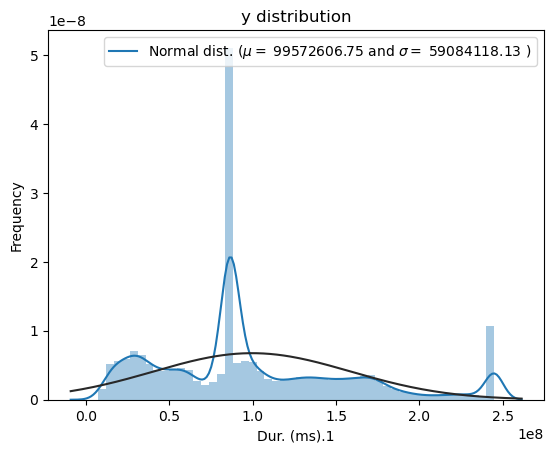

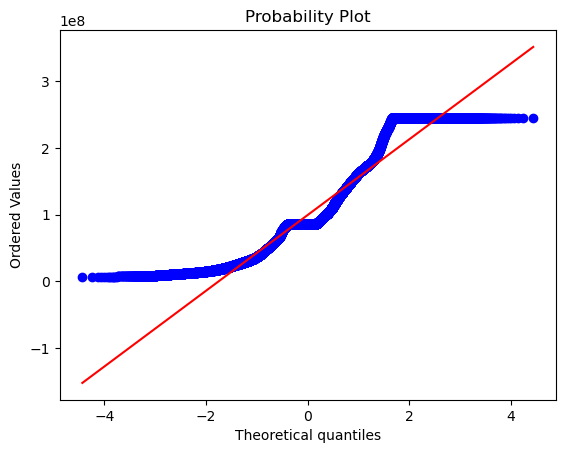

In [46]:
# xdr ms
sns.distplot(df['Dur. (ms).1'] , fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Dur. (ms).1'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Dur. (ms).1'], plot=plt)
plt.show()

### Heavily rightly skewed.


 mu = 11817.84 and sigma = 18011.20



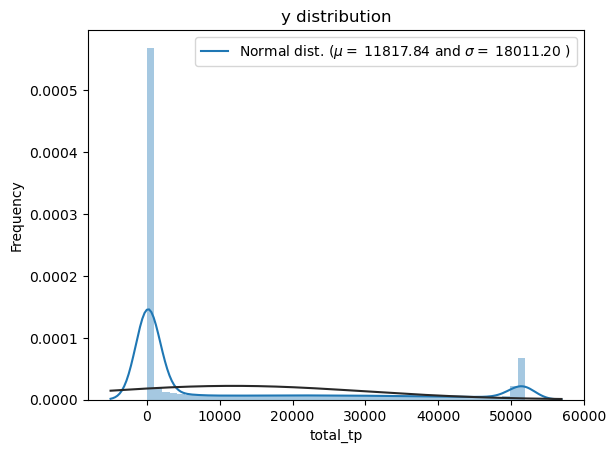

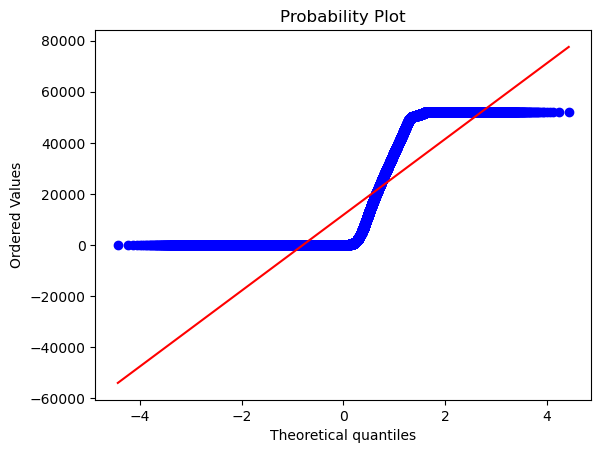

In [47]:
# total_tp
sns.distplot(df['total_tp'] , fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['total_tp'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['total_tp'], plot=plt)
plt.show()

### Heavily skewed to the right.


 mu = 59.89 and sigma = 28.34



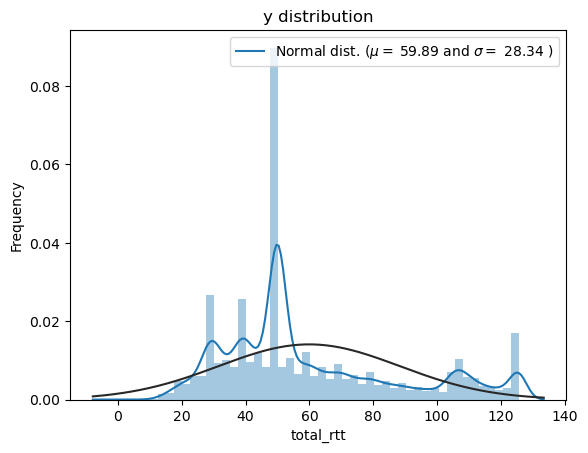

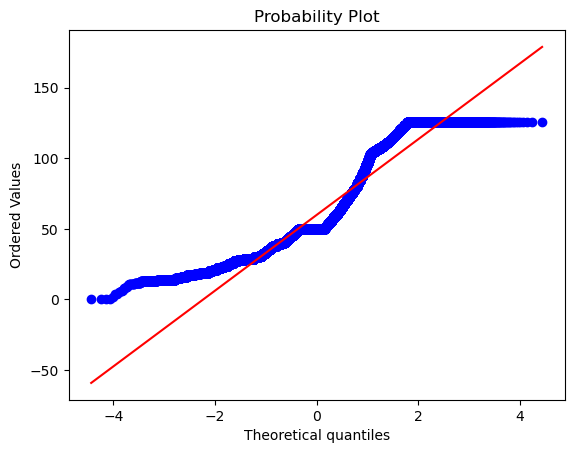

In [48]:
# total_rtt
sns.distplot(df['total_rtt'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['total_rtt'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['total_rtt'], plot=plt)
plt.show()

### Right tailed too.


 mu = 9199155.87 and sigma = 118892608.03



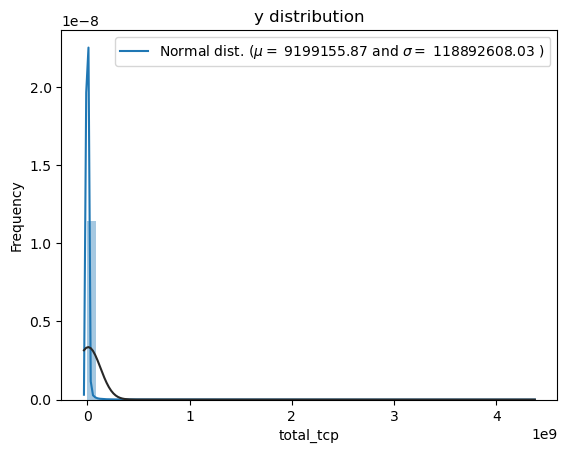

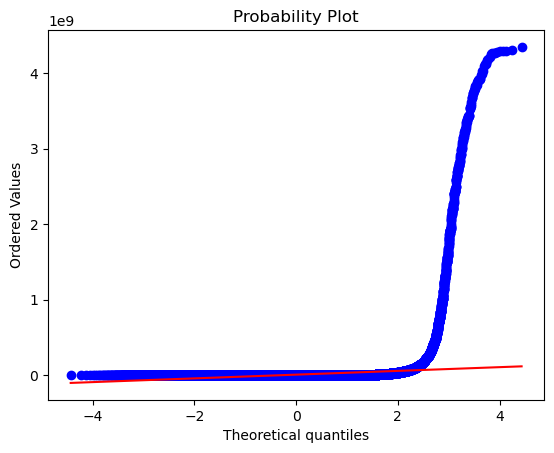

In [49]:
# total_tcp
sns.distplot(df['total_tcp'] , fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['total_tcp'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['total_tcp'], plot=plt)
plt.show()

## Bivariate Analysis
– explore the relationship between each application & the total DL+UL data using appropriate methods and interpret your findings.

(Social Media, Google, Email, YouTube, Netflix, Gaming ++ total_bytes).

In [50]:
# data['total'] = data['Total DL (Bytes)'] + data['Total UL (Bytes)']
# sns.barplot(x = data['social_media'], y = data['total'])

biv_data = df[['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'total_bytes', 'other']]
# adding a summation row in all columns
biv_data.loc['totals'] = biv_data.sum()
biv_data.tail()

,social_media,google,email,youtube,netflix,gaming,total_bytes,other
149997,2.352181e+06,4.415361e+06,2.121718e+06,2.216552e+07,4.064329e+07,6.316281e+08,7.057839e+08,7.146381e+08
149998,1.260239e+06,6.585469e+06,2.058277e+06,2.451641e+07,1.502970e+07,5.669338e+08,6.276986e+08,1.324156e+08
149999,8.231090e+05,7.757267e+06,2.850914e+06,1.712251e+07,1.649484e+07,3.550664e+08,4.015220e+08,8.161200e+08
150000,1.828250e+06,7.807295e+06,2.259102e+06,2.264348e+07,2.262861e+07,4.303331e+08,4.969844e+08,4.293653e+08
totals,2.742394e+11,1.171102e+12,3.388676e+11,3.396545e+12,3.394314e+12,6.455040e+13,7.436519e+13,6.440523e+13


### Applications total bytes

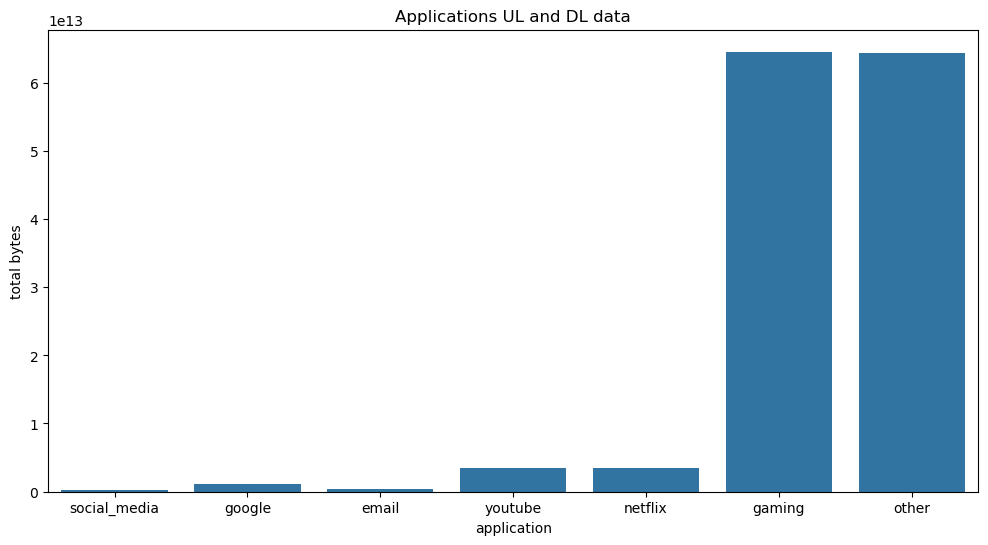

In [51]:
a = biv_data.tail(1)
long_df = pd.melt(a)
long_df = long_df.drop([6], axis  = 0)
plt.figure(figsize=(12,6))
sns.barplot(x = long_df.variable, y = long_df.value)
plt.title('Applications UL and DL data')
plt.ylabel('total bytes')
plt.xlabel('application')
plt.show()

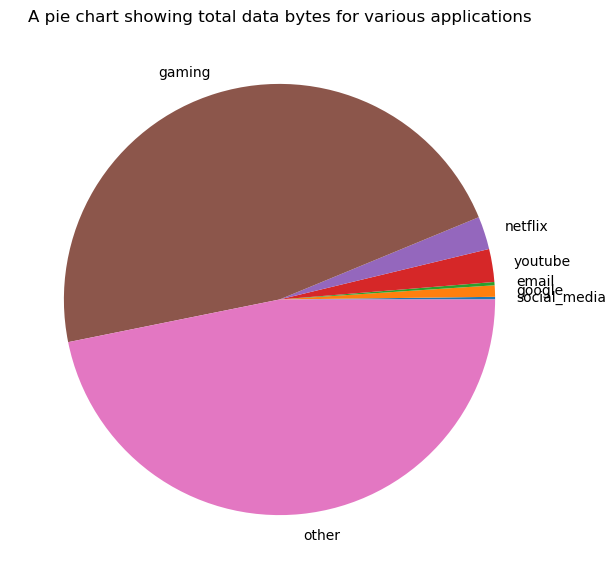

In [52]:
fig = plt.figure(figsize =(10, 7)) 
a = biv_data.drop(['total_bytes'], axis = 1)
plt.pie(a.loc['totals'], labels = a.columns)
plt.title('A pie chart showing total data bytes for various applications')
plt.show()

Will you look at that!!!
Gamers Republic!!
*  The large percentage of **others** can be explained by many applications under the name others.
*  As for gaming:
  1. The applications are heavy. (Require more data)
  2. Most of the users are gamers.
  3. Most of the applications in the hand sets are games.

#### One on one plots on the apps vs total_bytes

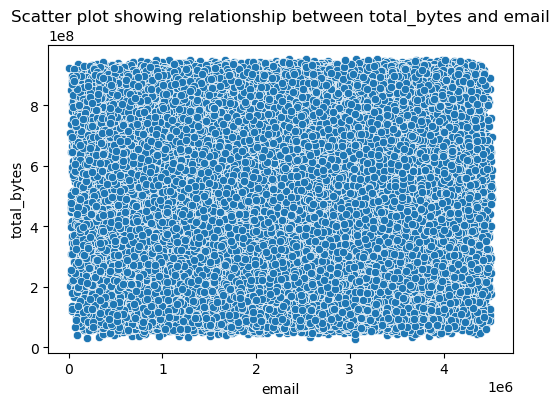

In [53]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data = df, x='email', y='total_bytes')
plt.title('Scatter plot showing relationship between total_bytes and email')
plt.show()

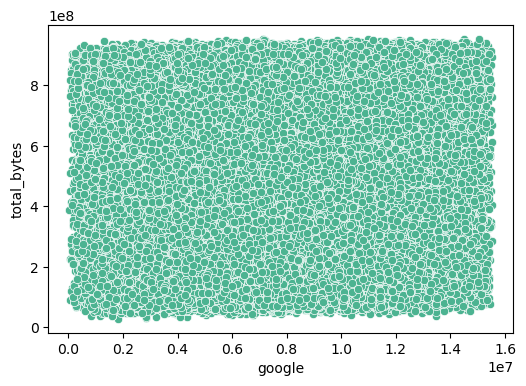

In [54]:
plt.figure(figsize=(6, 4))
# sns.jointplot(data = df, x='google', y='total_bytes', kind = 'hex', color = '#4CB391')
sns.scatterplot(data = df, x='google', y='total_bytes', color = '#4CB391')
# plt.title('Hexplot plot showing relationship between total_bytes and google', size=20)
plt.show()

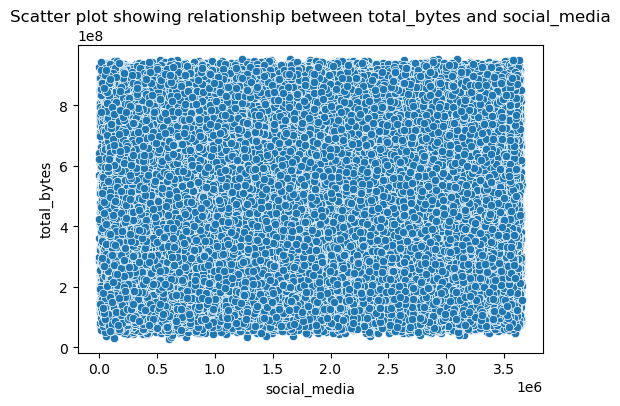

In [55]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data = df, x='social_media', y='total_bytes')
plt.title('Scatter plot showing relationship between total_bytes and social_media')
plt.show()

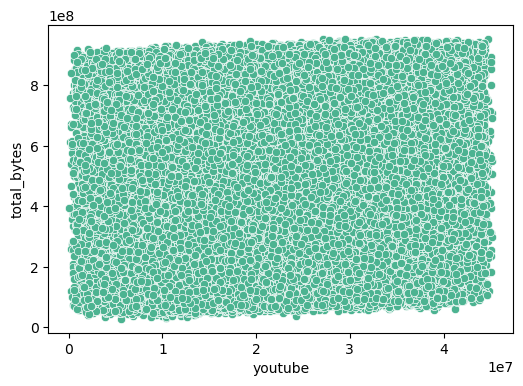

In [56]:
plt.figure(figsize=(6, 4))
# sns.jointplot(data = data, x='youtube', y='total_bytes', kind = 'hex', color = '#4CB391')
sns.scatterplot(data = df, x='youtube', y='total_bytes', color = '#4CB391')
# plt.title('Hexplot plot showing relationship between total_bytes and youtube')
plt.show()

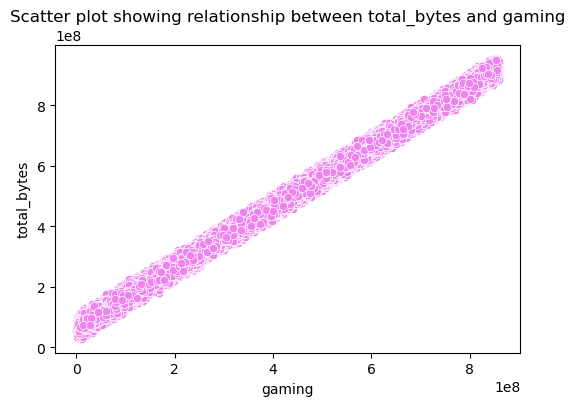

In [57]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data = df, x='gaming', y='total_bytes', color = 'violet')
plt.title('Scatter plot showing relationship between total_bytes and gaming')
plt.show()

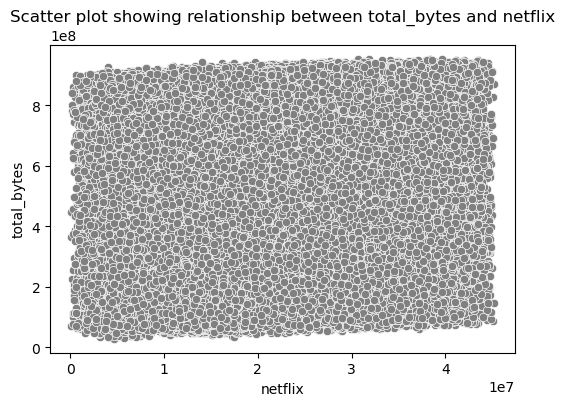

In [58]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data = df, x='netflix', y='total_bytes', color = 'grey')
plt.title('Scatter plot showing relationship between total_bytes and netflix')
plt.show()

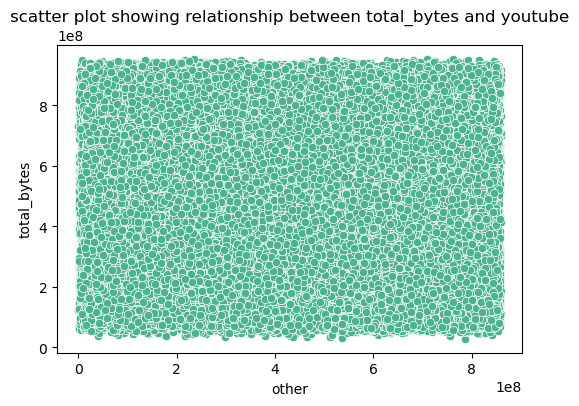

In [59]:
plt.figure(figsize=(6, 4))
# sns.jointplot(data = data, x='other', y='total_bytes', kind = 'hex', color = '#4CB391')
sns.scatterplot(data = df, x='other', y='total_bytes', color = '#4CB391')
plt.title('scatter plot showing relationship between total_bytes and youtube')
plt.show()

## Variable transformations
– segment the users into top five decile classes based on the total duration for all sessions and compute the total data (DL+UL) per decile class.

In [60]:
# adding Decile_rank column to the DataFrame 
df['Decile_rank'] = pd.qcut(df['Dur. (ms).1'], 5, labels = False) 
# data.columns

In [61]:
new_df = df[['Decile_rank', 'total_bytes']]
a = new_df.groupby('Decile_rank').sum()
a

,total_bytes
Decile_rank,
0,1.488405e+13
1,1.492541e+13
2,1.478247e+13
3,1.485492e+13
4,1.491834e+13


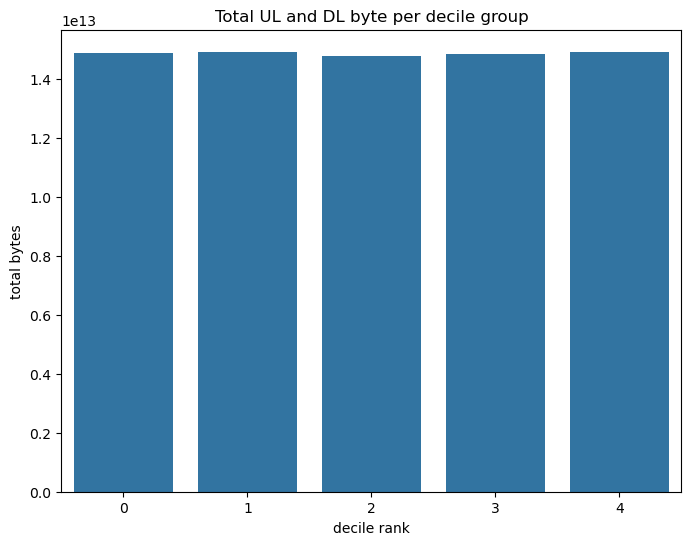

In [62]:
plt.figure(figsize=(8,6))
sns.barplot(x = a.index, y = a.total_bytes)
plt.title('Total UL and DL byte per decile group')
plt.ylabel('total bytes')
plt.xlabel('decile rank')
plt.show()

## Correlation Analysis
– compute a correlation matrix for the following variables and interpret your findings: Social Media data, Google data, Email data, Youtube data, Netflix data, Gaming data, Other data - (jupyter notebook + slide )

### correlation on the total bytes

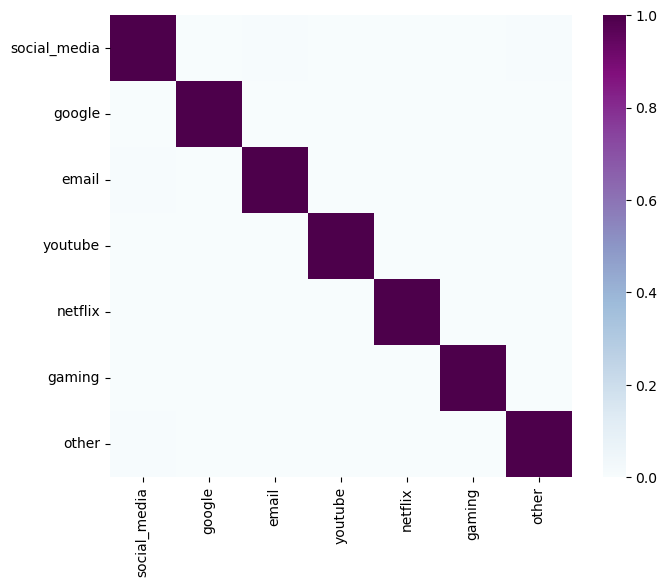

In [63]:
corr_data = df[['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other']]

    
corr = corr_data.corr()
f_fig, f_ax = plt.subplots(figsize=(8, 6))
f_ax = sns.heatmap(corr, vmin=0, vmax=1, square=True,
                   annot=False, annot_kws={"size": 10}, cmap="BuPu")

##### The correlation between the variables is super low. 

### On the upload bytes

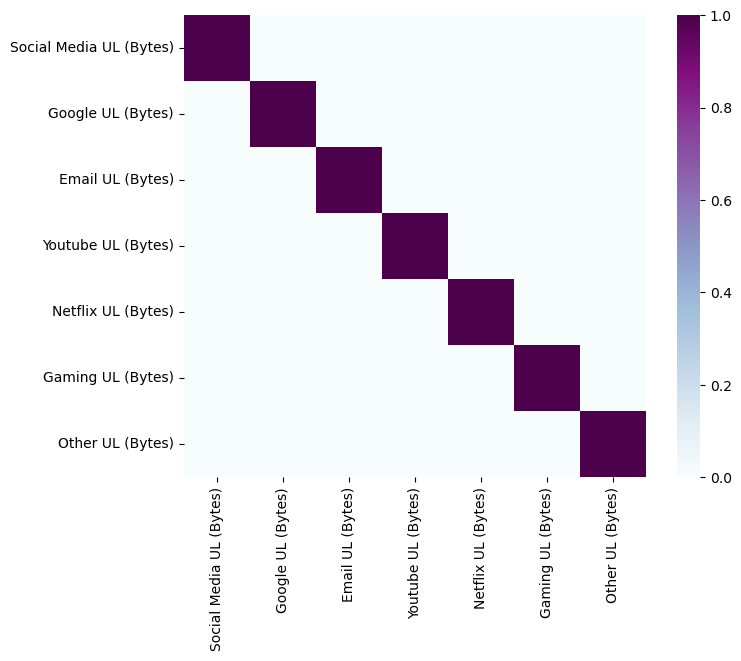

In [64]:
corr_data = df[['Social Media UL (Bytes)', 'Google UL (Bytes)', 'Email UL (Bytes)', 'Youtube UL (Bytes)', 'Netflix UL (Bytes)', 'Gaming UL (Bytes)', 'Other UL (Bytes)']]

    
corr = corr_data.corr()
f_fig, f_ax = plt.subplots(figsize=(8, 6))
f_ax = sns.heatmap(corr, vmin=0, vmax=1, square=True,
                   annot=False, annot_kws={"size": 10}, cmap="BuPu")

##### The correlation between the variables is super low. 

### On the download bytes

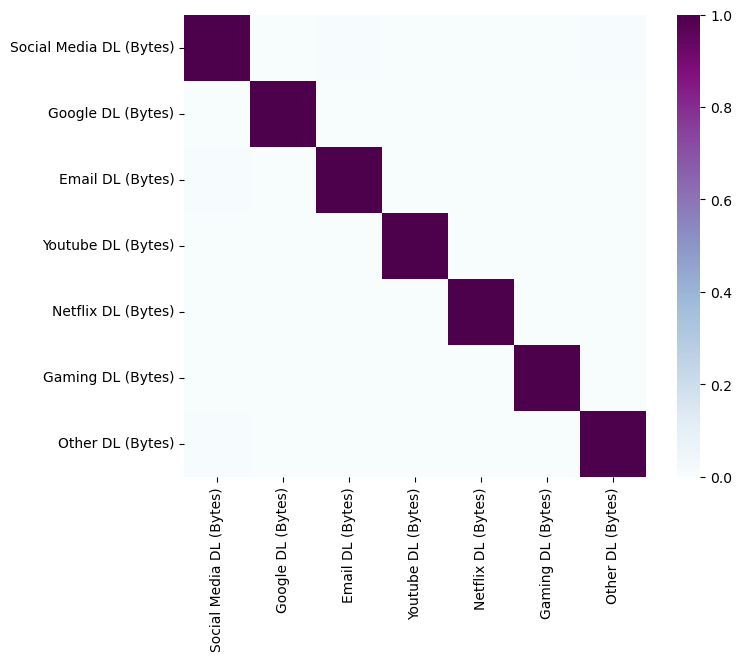

In [65]:
corr_data = df[['Social Media DL (Bytes)', 'Google DL (Bytes)', 'Email DL (Bytes)', 'Youtube DL (Bytes)', 'Netflix DL (Bytes)', 'Gaming DL (Bytes)', 'Other DL (Bytes)']]
corr = corr_data.corr()
f_fig, f_ax = plt.subplots(figsize=(8, 6))
f_ax = sns.heatmap(corr, vmin=0, vmax=1, square=True,
                   annot=False, annot_kws={"size": 10}, cmap="BuPu")

##### The correlation between the variables is super low. 

## Dimensionality Reduction
– perform a principal component analysis to reduce the dimensions of your data and provide a useful interpretation of the results.

In [66]:
# standardize the data
from sklearn.preprocessing import StandardScaler
new_numerical = [] #this leaves out the categorical columns that were encoded but not replaced
for col in df.columns:
    if df[col].dtype in ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']:
        new_numerical.append(col)
        
seg = df[new_numerical].copy()
seg = seg.drop(['MSISDN/Number'], axis = 1) #drop the id col
scaler = StandardScaler()
scaled_data = scaler.fit_transform(seg)

In [67]:
scaled_data.shape

(150001, 65)

In [68]:
pca = PCA()
pca.fit(scaled_data)

PCA()

In [69]:
pca.explained_variance_ratio_

array([1.85017352e-01, 7.68864104e-02, 4.92174246e-02, 4.61617104e-02,
       4.30208393e-02, 3.97720721e-02, 3.46860190e-02, 3.11084568e-02,
       3.09570630e-02, 3.08874495e-02, 3.07849419e-02, 3.06405328e-02,
       3.05611181e-02, 2.55361834e-02, 2.35166252e-02, 2.08573292e-02,
       1.82868166e-02, 1.74326108e-02, 1.72508929e-02, 1.67839787e-02,
       1.54453260e-02, 1.54316245e-02, 1.53666268e-02, 1.53198576e-02,
       1.52325163e-02, 1.48139471e-02, 1.41101455e-02, 1.35184060e-02,
       1.24333048e-02, 1.08584199e-02, 8.46985989e-03, 6.97142807e-03,
       6.32674743e-03, 5.85087197e-03, 5.68208737e-03, 4.84407629e-03,
       4.46501823e-03, 3.81661603e-03, 2.64183060e-03, 2.01537917e-03,
       1.78431264e-03, 1.69266887e-03, 1.47432490e-03, 1.02165198e-03,
       3.97938705e-04, 3.78780526e-04, 2.69764146e-04, 4.49044670e-07,
       7.06470615e-08, 6.19619303e-08, 3.30474576e-08, 2.66132522e-08,
       2.46351914e-12, 2.64465492e-13, 1.30637862e-14, 1.02536996e-14,
      

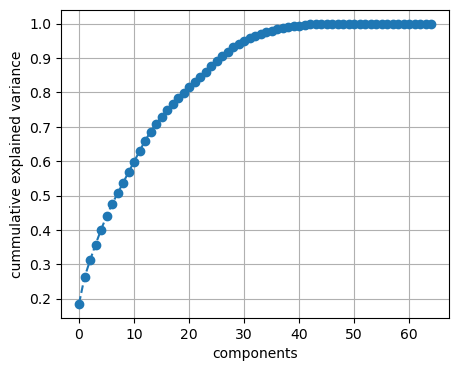

In [70]:
plt.figure(figsize = (5,4))
plt.plot(range(65), pca.explained_variance_ratio_.cumsum (), marker = 'o', linestyle = '--')
plt.xlabel('components')
plt.ylabel('cummulative explained variance')
plt.grid(True)
plt.show()

When choosing the number of components, the number cutting at least 80% of the cumm explained variance is considered.
**n = 23**

In [71]:
pca = PCA(n_components = 23)
pca.fit(scaled_data)

PCA(n_components=23)

In [72]:
pca_scores = pca.transform(scaled_data)

In [73]:
# new_data_df = pd.concat([seg.reset_index(drop = True), pd.DataFrame(pca_scores)], axis = 1)
# c.columns.values[-2:] = ['component1', 'component2']
# new_data_df.head() #contains the original cols 
a = pd.DataFrame(pca_scores)
a['MSISDN/Number'] = df['MSISDN/Number']
a.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,MSISDN/Number
0,-2.863825,-1.328887,2.092552,-1.896040,-0.064195,2.186218,-0.942250,1.157172,2.325966,0.394591,-0.539130,-0.466542,2.043119,0.061930,-0.096781,0.208825,1.045308,-0.232090,1.149804,-0.249788,0.423524,-1.013494,0.167397,3.366496e+10
1,-2.409496,1.798377,2.133966,0.748591,2.306007,2.112750,-1.231481,0.220252,-2.500039,0.692228,-1.889986,2.794258,-1.082158,1.121267,-0.460715,0.334730,0.633706,-0.682881,-0.250431,-0.429609,-0.862489,0.696496,-0.499607,3.368185e+10
2,-2.770589,-1.761624,2.136810,-0.252874,-1.431683,2.153083,-1.173490,-0.170832,-2.735086,1.234448,1.331407,0.396375,1.188472,0.050573,-0.242080,0.150244,1.075715,-0.437403,-0.655071,-0.937182,0.351964,-1.408202,0.054293,3.373042e+10
3,-2.853805,3.531011,2.366076,2.286370,1.109179,2.098281,-1.158746,-0.564856,-1.097813,-2.549690,0.995765,0.295236,1.089923,0.013743,-0.199656,0.141146,1.698868,-0.405468,-0.676747,-0.383116,-0.410802,0.248309,0.700773,3.373042e+10
4,-2.778277,0.964194,2.254909,0.883148,0.197079,2.161517,-1.165227,0.708388,-1.853558,-1.447465,-0.332261,1.567272,0.786385,0.094192,-0.240400,0.200803,1.217886,-0.230371,1.391035,-0.295381,1.801754,-0.152980,-1.051958,3.369980e+10


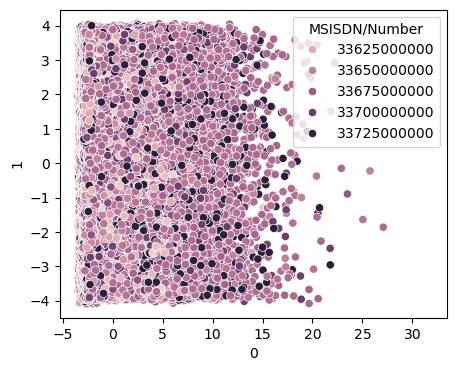

In [74]:
#plotting the first 2 components since they explain most of the variability.
plt.figure(figsize=(5,4))
sns.scatterplot(x= a[0], y = a[1], hue = a['MSISDN/Number'])
plt.show()

## Task 2. User Engagement analysis
In the current dataset you’re expected to track the user’s engagement using the following engagement metrics: 
* sessions frequency 
* the duration of the session 
* the sessions total traffic (download and upload (bytes))


### * Sessions frequency, sessions duration, sessions total traffic.

In [75]:
user_data = df[['MSISDN/Number', 'total_bytes', 'Dur. (ms).1', 'Bearer Id']]

# def f(x):
#     d = {}
#     d['total_bytes'] = x['total_bytes'].sum()
#     d['Dur. (ms).1'] = x['Dur. (ms).1'].sum()
#     d['Bearer Id'] = x['Bearer Id'].count()
#     return pd.Series(d, index=['total_bytes', 'Dur. (ms).1', 'Bearer Id'])

# user_data.groupby('MSISDN/Number').apply(f)

In [76]:
agg_user_data = user_data.groupby('MSISDN/Number').agg({'Bearer Id':'count', 'Dur. (ms).1':'sum',  'total_bytes': 'sum'})
agg_user_data.columns = ['sessions_freq', 'sessions_duration(ms)', 'sessions_traffic(bytes)']
agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes)
MSISDN/Number,,,
3.360416e+10,1631,1.578704e+11,8.098334e+11
3.360417e+10,1,5.892230e+07,5.723161e+08
3.360417e+10,2,2.129908e+08,9.682418e+08
3.360418e+10,1,1.273675e+08,7.534301e+08
3.360418e+10,1,4.512601e+07,2.723432e+08


### Top 10 users with high sessions frequency

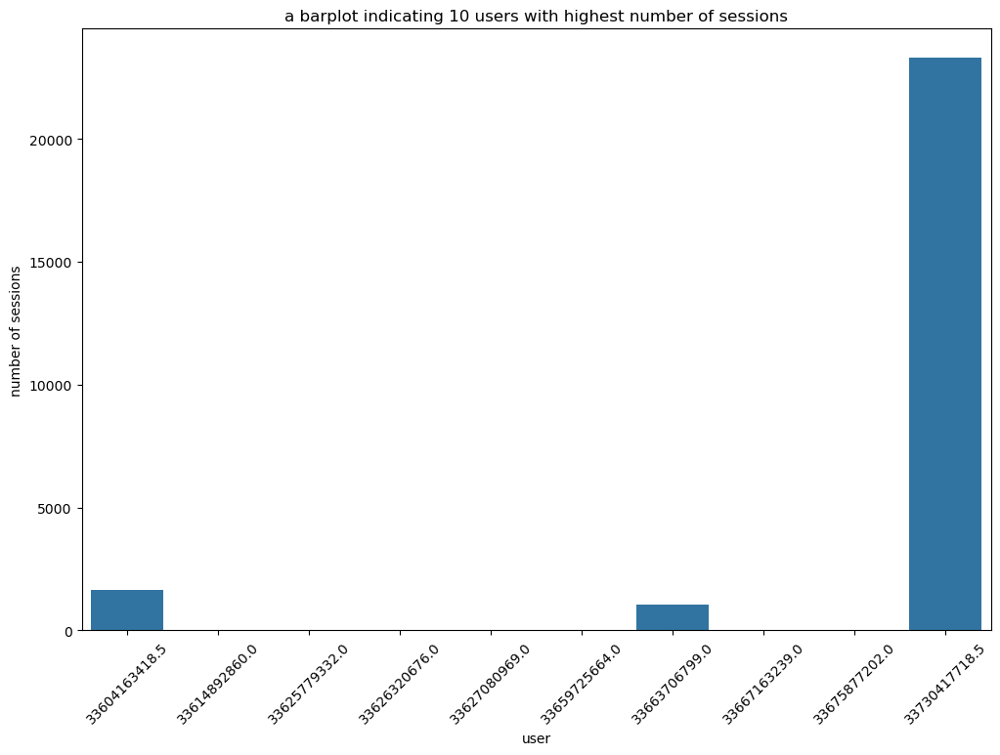

In [77]:
a = agg_user_data.sort_values(by = 'sessions_freq', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = a.index, y = a['sessions_freq'])
plt.ylabel('number of sessions')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest number of sessions')
plt.show()

### Top 10 users with high sessions traffic

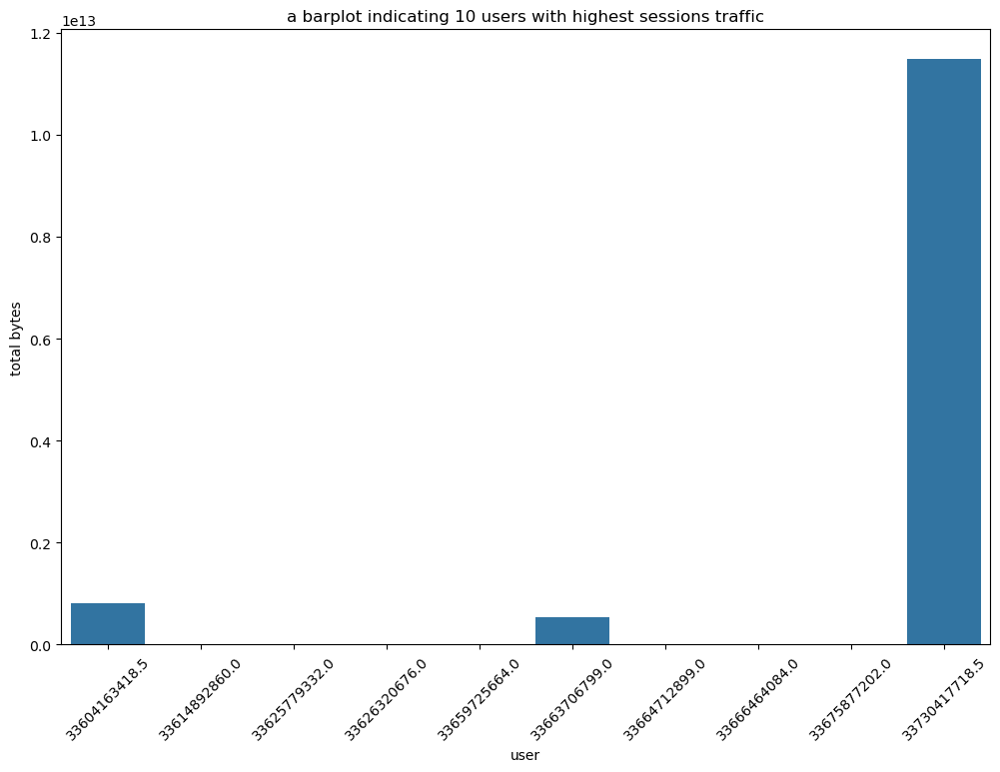

In [78]:
b = agg_user_data.sort_values(by = 'sessions_traffic(bytes)', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = b.index, y = b['sessions_traffic(bytes)'])
plt.ylabel('total bytes')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest sessions traffic')
plt.show()

### Top 10 users with longest sessions duration

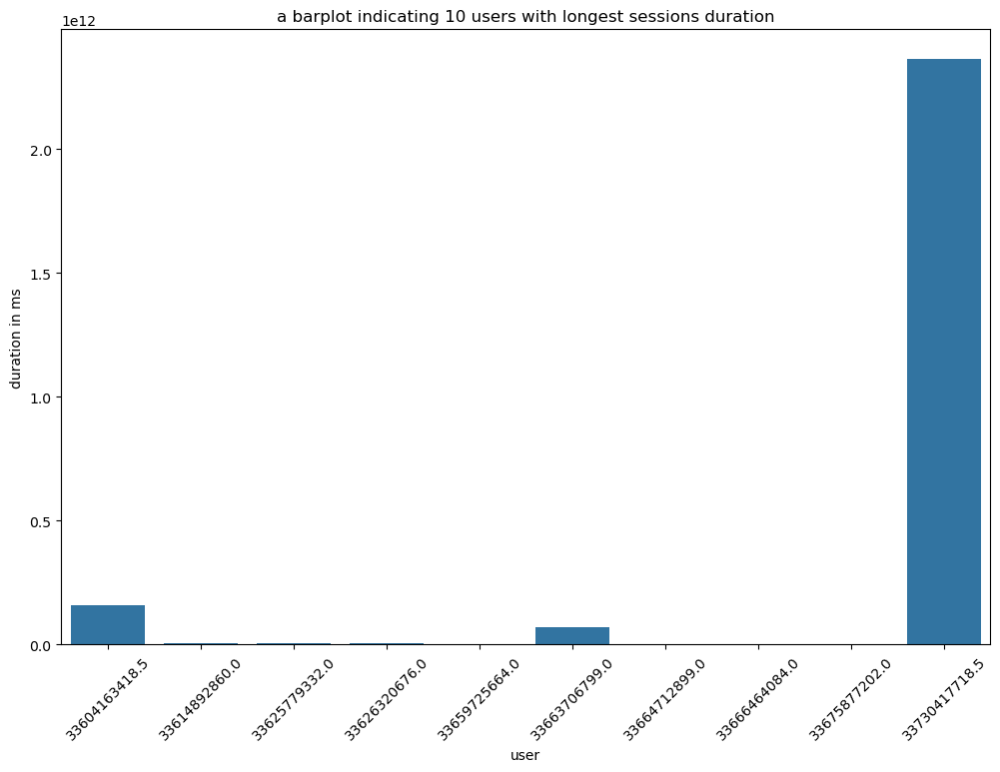

In [79]:
c = agg_user_data.sort_values(by = 'sessions_duration(ms)', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = b.index, y = b['sessions_duration(ms)'])
plt.ylabel('duration in ms')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with longest sessions duration')
plt.show()

In [80]:
# users in the 3 categories.
a = a.index.to_list()
b = b.index.to_list()
c = c.index.to_list()

def IntersecOfSets(arr1, arr2, arr3): 
    s1 = set(arr1) 
    s2 = set(arr2) 
    s3 = set(arr3) 

    set1 = s1.intersection(s2)
    result_set = set1.intersection(s3) 
      
    final_list = list(result_set) 
    print(final_list) 
  
IntersecOfSets(a, b, c) 

[33659725664.0, 33625779332.0, 33626320676.0, 33663706799.0, 33675877202.0, 33730417718.5, 33604163418.5, 33614892860.0]


### Normalize each engagement metric and run a k-means (k=3) to classify customers in three groups of engagement.


In [81]:
# Normalizing the aggregated dataset using log transformation
norm_agg_user_data = np.log1p(agg_user_data)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes)
MSISDN/Number,,,
3.360416e+10,7.397562,25.785040,27.420094
3.360417e+10,0.693147,17.891730,20.165202
3.360417e+10,1.098612,19.176760,20.690992
3.360418e+10,0.693147,18.662587,20.440147
3.360418e+10,0.693147,17.624969,19.422574


In [82]:
norm_agg_user_data.shape

(89092, 3)

In [83]:
# kmeans on 3 clusters.
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
kmeans.fit(norm_agg_user_data)
kmeans_data = kmeans.predict(norm_agg_user_data)

In [84]:
# add the predicted clusters as a column in the df
norm_agg_user_data['clusters'] = pd.Series(kmeans_data, index=norm_agg_user_data.index)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,7.397562,25.785040,27.420094,0
3.360417e+10,0.693147,17.891730,20.165202,1
3.360417e+10,1.098612,19.176760,20.690992,0
3.360418e+10,0.693147,18.662587,20.440147,0
3.360418e+10,0.693147,17.624969,19.422574,1


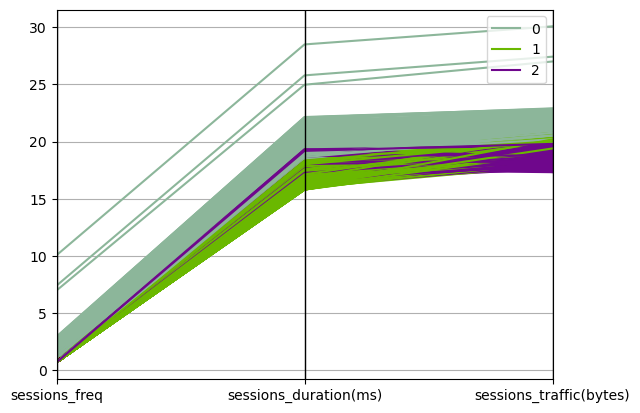

In [85]:
#plot the clusters(3D)
pd.plotting.parallel_coordinates(norm_agg_user_data, 'clusters')
plt.show()

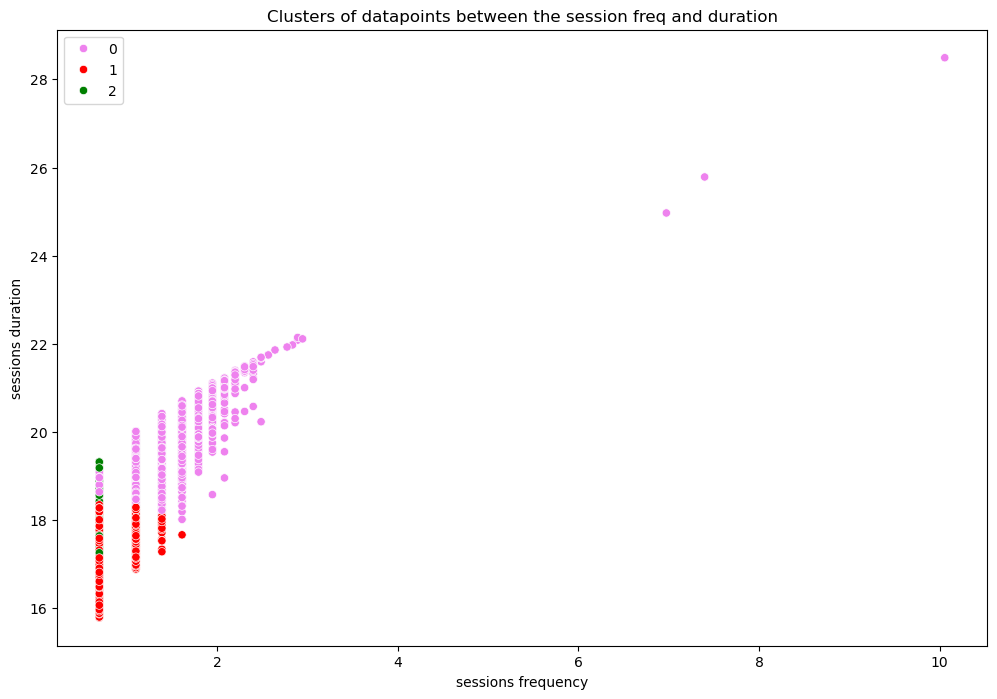

In [86]:
# comparing the clusters in variable pairs
# frequency and duration
x = norm_agg_user_data[['sessions_freq', 'sessions_duration(ms)', 'clusters']]
plt.figure(figsize = (12,8))
sns.scatterplot(x = norm_agg_user_data['sessions_freq'],  y = norm_agg_user_data['sessions_duration(ms)'], palette = ['violet', 'red', 'green'], hue = norm_agg_user_data['clusters'])
# sns.palplot(sns.color_palette(flatui))
plt.title('Clusters of datapoints between the session freq and duration')
plt.xlabel('sessions frequency')
plt.ylabel('sessions duration')
plt.legend()
plt.show()

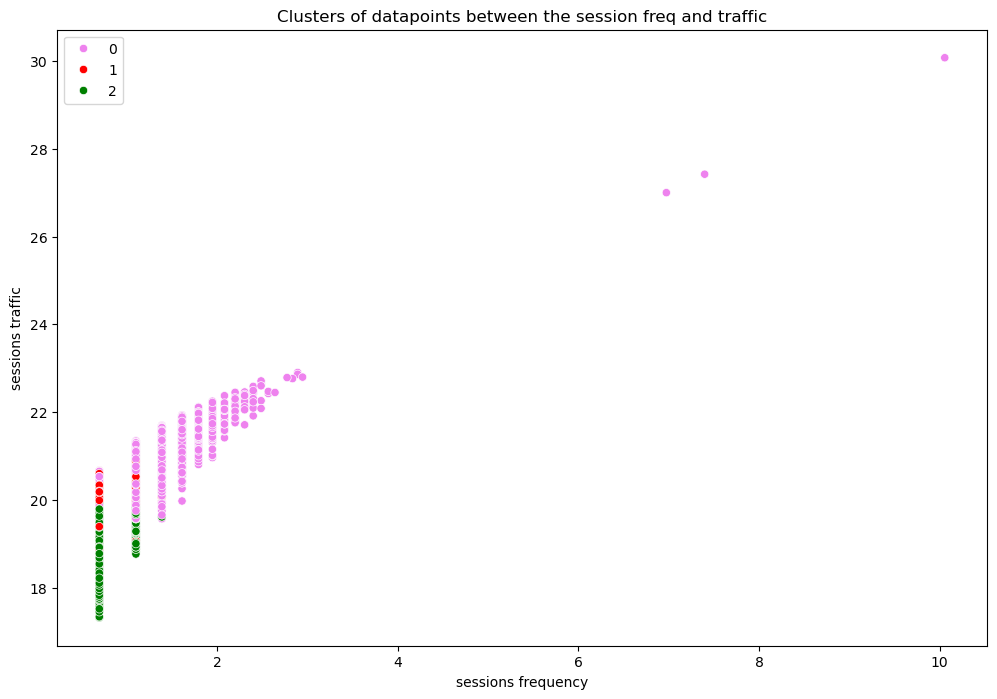

In [87]:
# comparing the clusters in variable pairs

# frequency and traffic
x = norm_agg_user_data[['sessions_freq', 'sessions_traffic(bytes)', 'clusters']]
plt.figure(figsize = (12,8))
sns.scatterplot(x = norm_agg_user_data['sessions_freq'],  y = norm_agg_user_data['sessions_traffic(bytes)'], palette = ['violet', 'red', 'green'], hue = norm_agg_user_data['clusters'])
# sns.palplot(sns.color_palette(flatui))
plt.title('Clusters of datapoints between the session freq and traffic')
plt.xlabel('sessions frequency')
plt.ylabel('sessions traffic')
plt.legend()
plt.show()

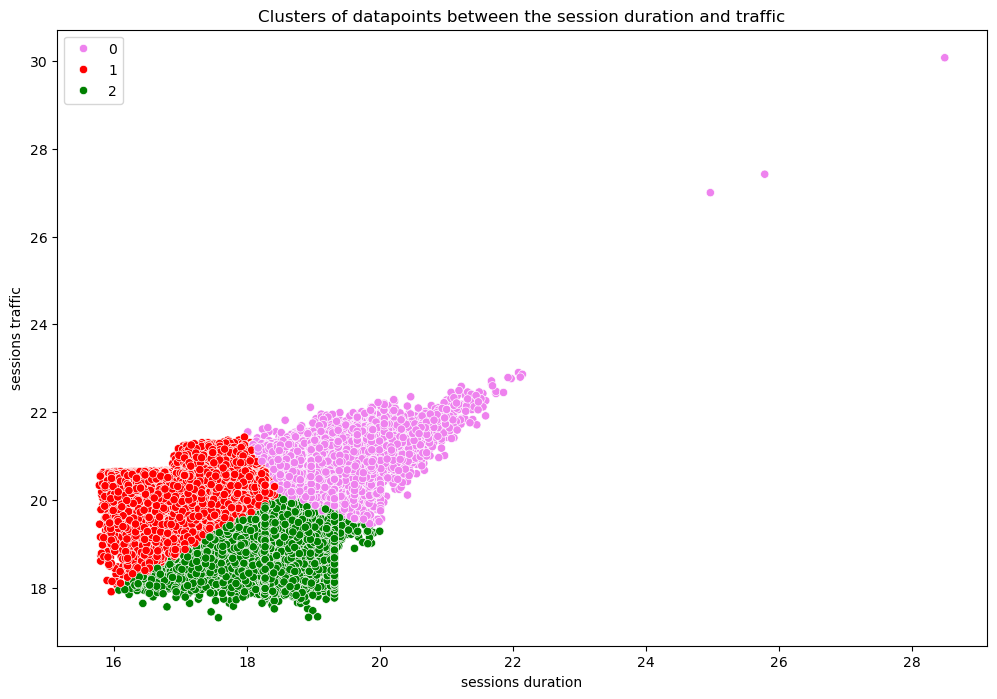

In [88]:
# comparing the clusters in variable pairs

# duration and traffic
x = norm_agg_user_data[['sessions_duration(ms)', 'sessions_traffic(bytes)', 'clusters']]
plt.figure(figsize = (12,8))
sns.scatterplot(x = norm_agg_user_data['sessions_duration(ms)'],  y = norm_agg_user_data['sessions_traffic(bytes)'], palette = ['violet', 'red', 'green'], hue = norm_agg_user_data['clusters'])
# sns.palplot(sns.color_palette(flatui))
plt.title('Clusters of datapoints between the session duration and traffic')
plt.xlabel('sessions duration')
plt.ylabel('sessions traffic')
plt.legend()
plt.show()

### * Compute the minimum, maximum, average & total non- normalized metrics for each cluster. Interpret your results visually with accompanying text. 

In [89]:
# add the clusters column to the non normalized data
agg_user_data['clusters'] = kmeans_data
agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,1631,1.578704e+11,8.098334e+11,0
3.360417e+10,1,5.892230e+07,5.723161e+08,1
3.360417e+10,2,2.129908e+08,9.682418e+08,0
3.360418e+10,1,1.273675e+08,7.534301e+08,0
3.360418e+10,1,4.512601e+07,2.723432e+08,1


In [90]:
agg_user_data.clusters.value_counts()

clusters
0    33721
1    31491
2    23880
Name: count, dtype: int64

In [91]:
# cluster 1 (cluster = 0)
cluster_1 = agg_user_data.loc[agg_user_data['clusters'] == 0]   #get observations under cluster 1
# cluster_1.loc['total_per_metric'] = cluster_1.sum()             #get the totals per metric
print(cluster_1.shape)
cluster_1.tail()

(33721, 4)


,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.370000e+10,2,1.727995e+08,1.045252e+09,0
3.370000e+10,1,1.456979e+08,5.931102e+08,0
3.370000e+10,1,1.244457e+08,8.267019e+08,0
3.370000e+10,1,1.716729e+08,8.274129e+08,0
3.373042e+10,23317,2.364128e+12,1.149296e+13,0


In [92]:
cluster_1.describe() # get the min, max and average per metric in cluster 1

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,33721.000000,3.372100e+04,3.372100e+04,33721.0
mean,2.683995,3.085875e+08,1.425830e+09,0.0
std,127.411531,1.290810e+10,6.280459e+10,0.0
min,1.000000,6.659556e+07,2.829957e+08,0.0
25%,1.000000,1.447975e+08,6.822680e+08,0.0
50%,2.000000,1.818182e+08,8.711007e+08,0.0
75%,2.000000,2.592000e+08,1.271147e+09,0.0
max,23317.000000,2.364128e+12,1.149296e+13,0.0


In [93]:
# cluster 2 (cluster = 1)
cluster_2 = agg_user_data.loc[agg_user_data['clusters'] == 1]   #get observations under cluster 2
# cluster_2.loc['total_per_metric'] = cluster_2.sum()             #get the totals per metric
print(cluster_2.shape)
cluster_2.tail()

(31491, 4)


,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.370000e+10,1,10196238.0,264915169.0,1
3.370000e+10,1,86399974.0,582285161.0,1
3.370000e+10,1,86399900.0,680420343.0,1
3.370000e+10,1,9498876.0,584400944.0,1
3.370000e+10,1,66045541.0,481066420.0,1


In [94]:
cluster_2.describe() # get the min, max and average per metric in cluster 2

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,31491.000000,3.149100e+04,3.149100e+04,31491.0
mean,1.108253,5.478148e+07,6.409798e+08,1.0
std,0.313554,2.857785e+07,2.418665e+08,0.0
min,1.000000,7.146574e+06,6.013219e+07,1.0
25%,1.000000,2.823123e+07,4.868157e+08,1.0
50%,1.000000,5.247463e+07,6.379098e+08,1.0
75%,1.000000,8.639985e+07,7.916251e+08,1.0
max,4.000000,1.096755e+08,2.034468e+09,1.0


In [95]:
# cluster 3 (cluster = 2)
cluster_3 = agg_user_data.loc[agg_user_data['clusters'] == 2]   #get observations under cluster 3
# cluster_3.loc['total_per_metric'] = cluster_3.sum()             #get the totals per metric
print(cluster_3.shape)
cluster_3.tail()

(23880, 4)


,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.369999e+10,1,244913628.0,129973102.0,2
3.369999e+10,1,134818012.0,164823680.0,2
3.370000e+10,1,144643611.0,143204761.0,2
3.370000e+10,1,244913628.0,336433505.0,2
3.370000e+10,1,214209016.0,394753492.0,2


In [96]:
cluster_3.describe() # get the min, max and average per metric in cluster 3

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,23880.000000,2.388000e+04,2.388000e+04,23880.0
mean,1.029899,1.174618e+08,2.554300e+08,2.0
std,0.170559,5.148197e+07,1.148072e+08,0.0
min,1.000000,9.599059e+06,3.324901e+07,2.0
25%,1.000000,8.639991e+07,1.567661e+08,2.0
50%,1.000000,1.022710e+08,2.480222e+08,2.0
75%,1.000000,1.487442e+08,3.484701e+08,2.0
max,3.000000,4.839601e+08,5.403886e+08,2.0


### * Aggregate user total traffic per application and derive the top 10 most engaged users per application 


In [97]:
apps_traffic = df[['social_media', 'netflix', 'youtube', 'google', 'email', 'gaming', 'other', 'MSISDN/Number']]
apps_traffic.tail()

,social_media,netflix,youtube,google,email,gaming,other,MSISDN/Number
149996,3.517065e+06,37561864.00,27955095.00,1.278491e+07,6.908760e+05,5.358069e+08,1.675193e+07,3.365069e+10
149997,2.352181e+06,40643294.00,22165518.00,4.415361e+06,2.121718e+06,6.316281e+08,7.146381e+08,3.366345e+10
149998,1.260239e+06,15029702.00,24516413.00,6.585469e+06,2.058277e+06,5.669338e+08,1.324156e+08,3.362189e+10
149999,8.231090e+05,16494842.00,17122508.00,7.757267e+06,2.850914e+06,3.550664e+08,8.161200e+08,3.361962e+10
150000,1.828250e+06,22628606.54,22643482.63,7.807295e+06,2.259102e+06,4.303331e+08,4.293653e+08,3.366371e+10


In [98]:
agg_apps_traffic = apps_traffic.groupby('MSISDN/Number').agg({'social_media':'sum', 'netflix':'sum', 'youtube':'sum', 'gaming':'sum', 
                                                            'google':'sum', 'email':'sum', 'other':'sum'})
agg_apps_traffic.head()

,social_media,netflix,youtube,gaming,google,email,other
MSISDN/Number,,,,,,,
3.360416e+10,2.971681e+09,3.640115e+10,3.651438e+10,7.040380e+11,1.278469e+10,3.704599e+09,6.842803e+11
3.360417e+10,9.188010e+05,2.755807e+07,1.954621e+07,5.132055e+08,4.362016e+06,2.299860e+06,2.212550e+08
3.360417e+10,2.214142e+06,2.438497e+07,3.353502e+07,8.778847e+08,1.153093e+07,4.457470e+06,1.086051e+09
3.360418e+10,3.451216e+06,3.458355e+07,9.879322e+06,6.953183e+08,3.368250e+05,3.931763e+06,2.068831e+08
3.360418e+10,2.538148e+06,1.903087e+07,2.779988e+07,2.009846e+08,7.159353e+06,3.871069e+06,8.461103e+08


#### 10 users with highest social media traffic

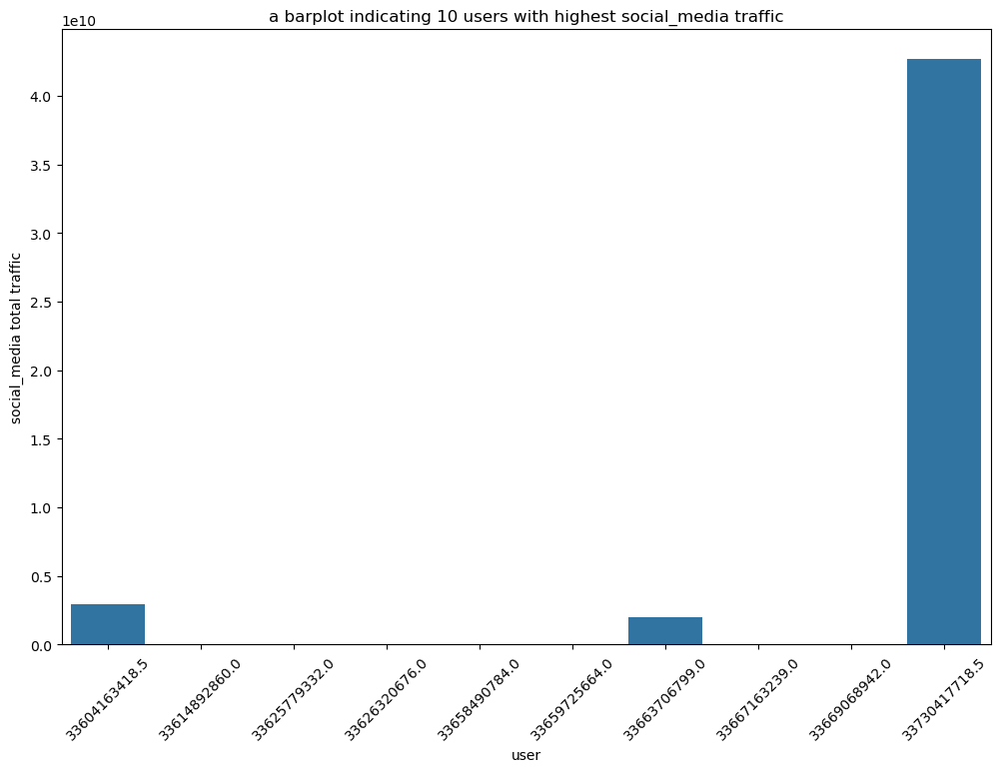

In [99]:
b = agg_apps_traffic.sort_values(by = 'social_media', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = b.index, y = b['social_media'])
plt.ylabel('social_media total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest social_media traffic')
plt.show()

#### 10 users with highest netflix traffic

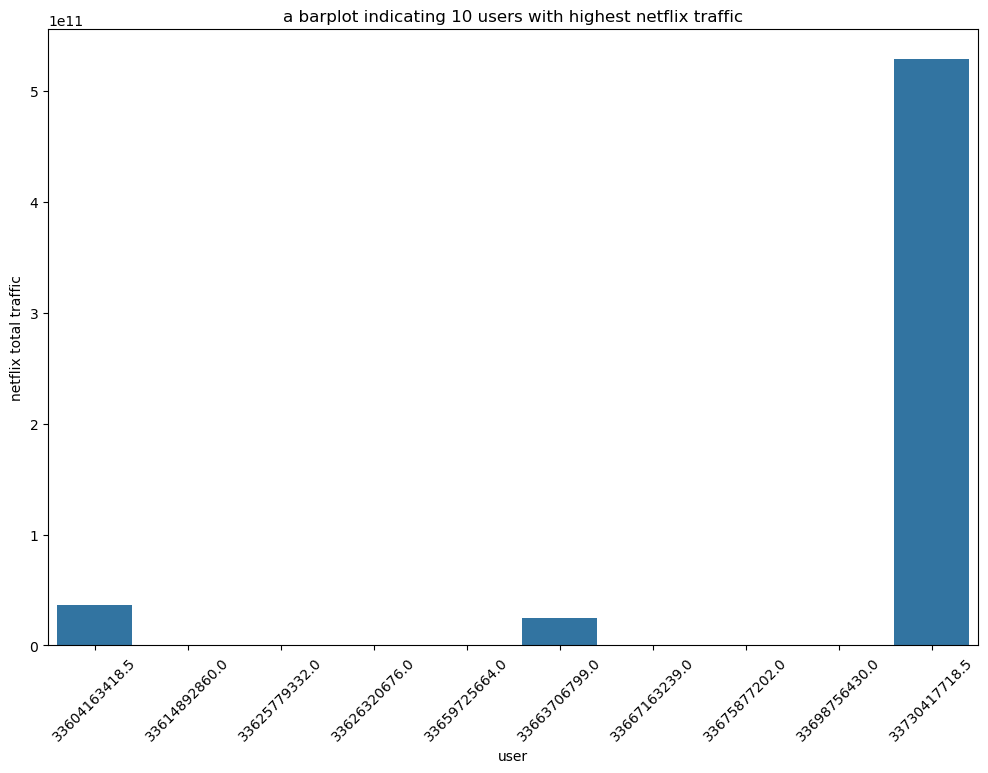

In [100]:
c = agg_apps_traffic.sort_values(by = 'netflix', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = c.index, y = c['netflix'])
plt.ylabel('netflix total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest netflix traffic')
plt.show()

#### 10 users with highest gaming traffic

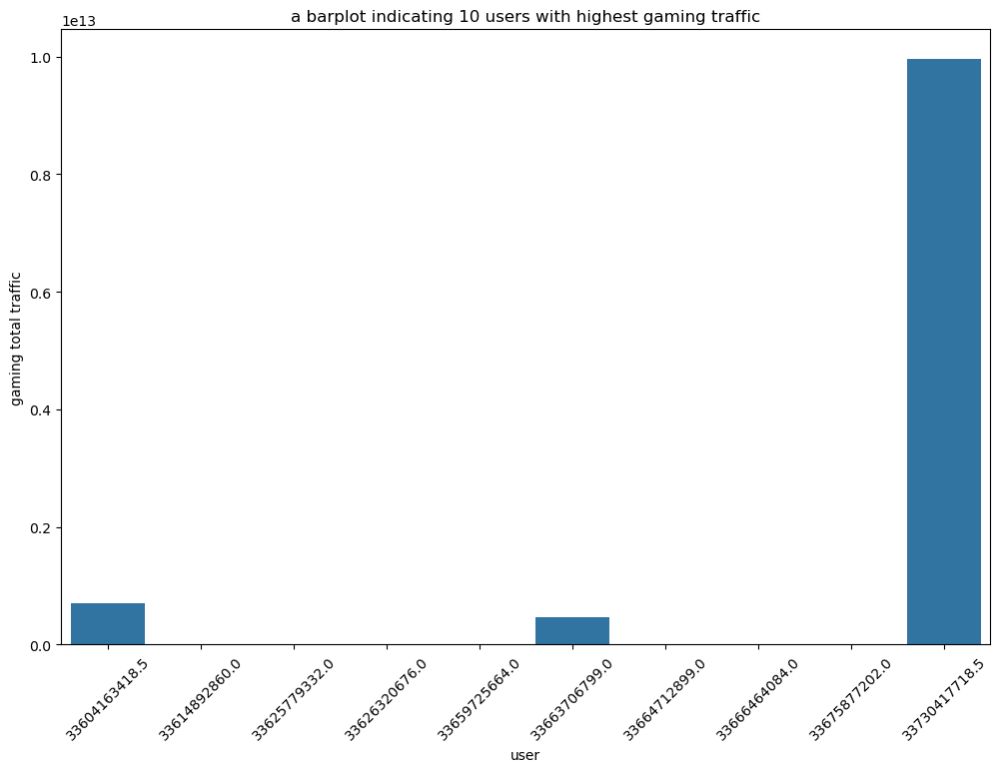

In [101]:
d = agg_apps_traffic.sort_values(by = 'gaming', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = d.index, y = d['gaming'])
plt.ylabel('gaming total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest gaming traffic')
plt.show()

#### 10 users with highest google traffic

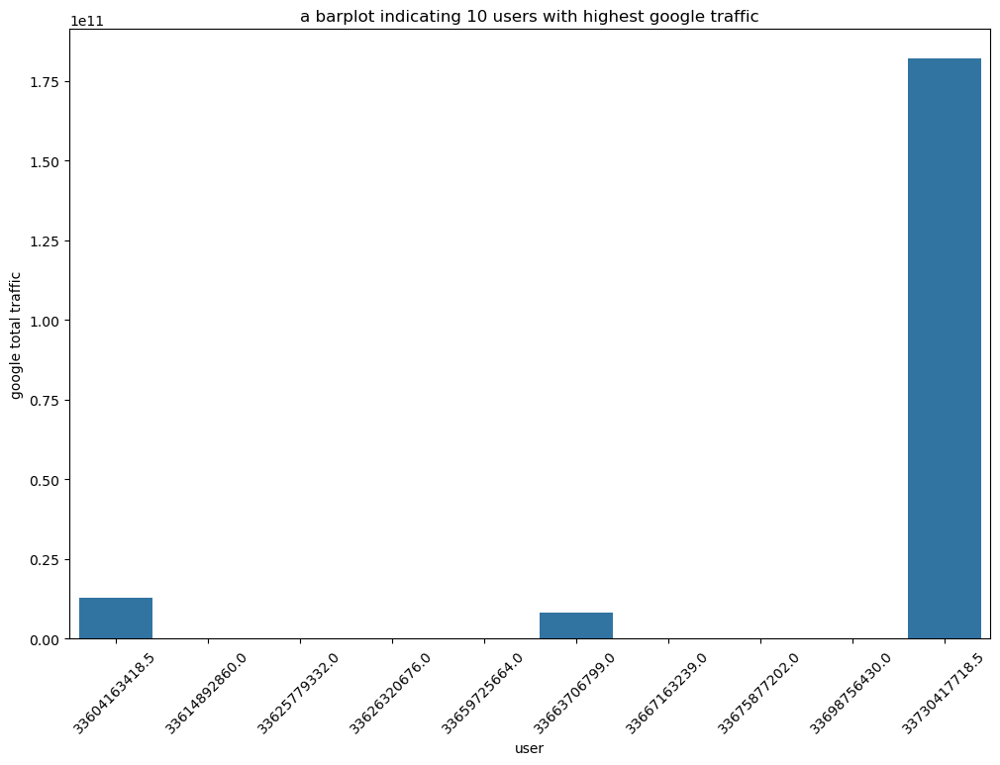

In [102]:
e = agg_apps_traffic.sort_values(by = 'google', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = e.index, y = e['google'])
plt.ylabel('google total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest google traffic')
plt.show()

#### 10 users with highest email traffic

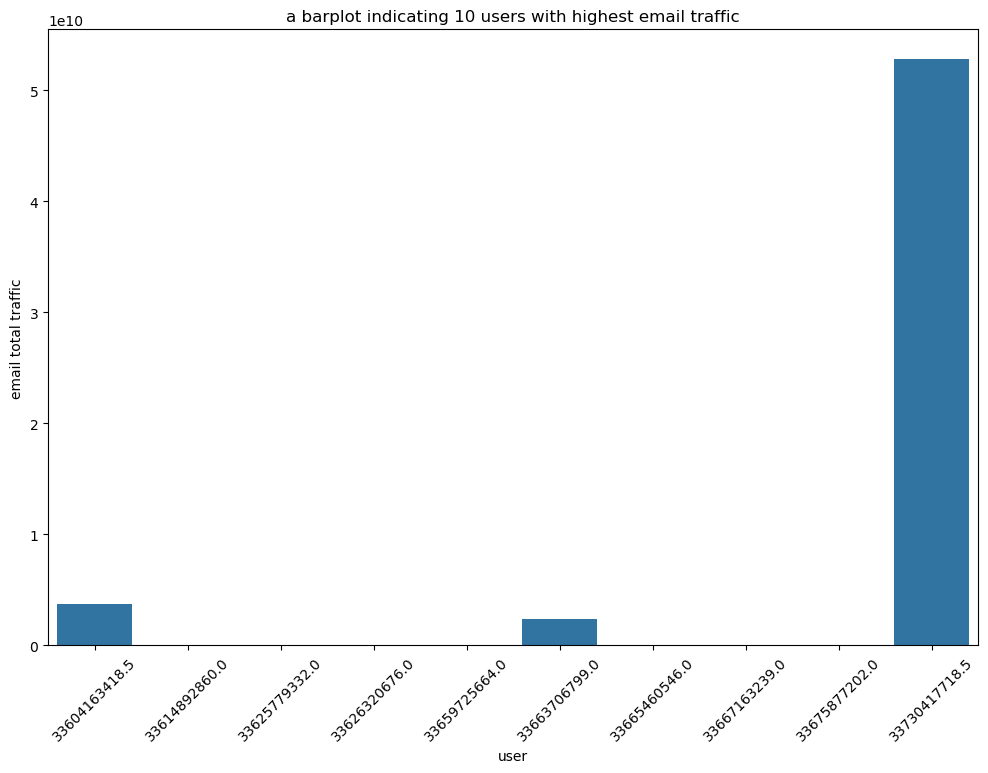

In [103]:
f = agg_apps_traffic.sort_values(by = 'email', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = f.index, y = f['email'])
plt.ylabel('email total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest email traffic')
plt.show()

#### 10 users with highest youtube traffic

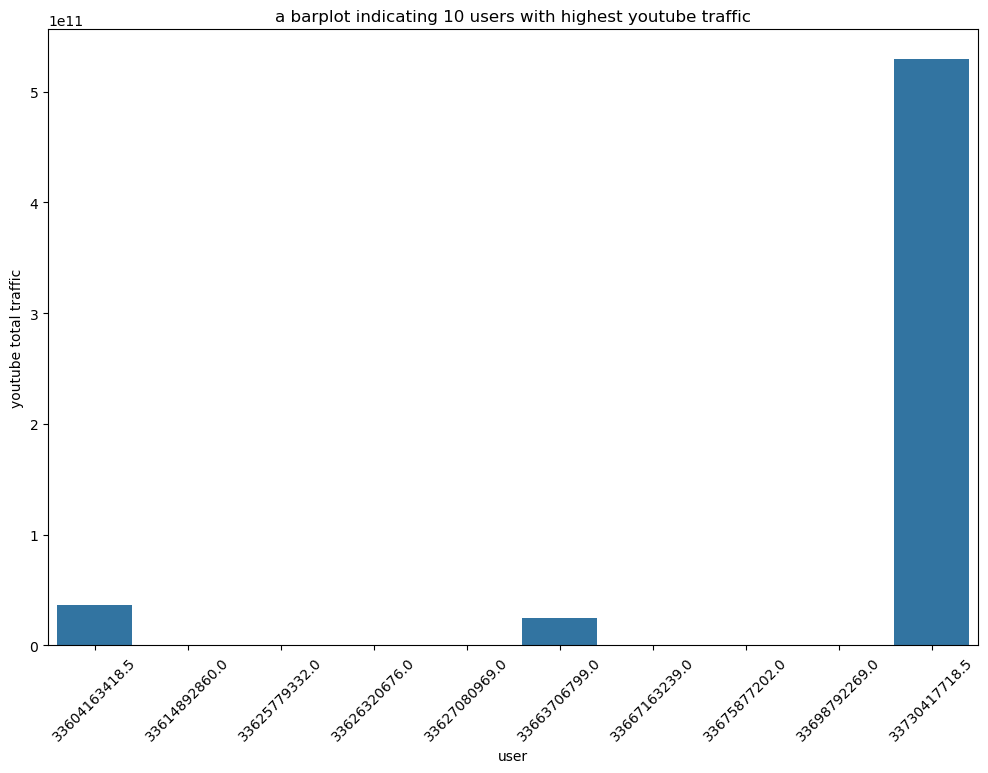

In [104]:
g = agg_apps_traffic.sort_values(by = 'youtube', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = g.index, y = g['youtube'])
plt.ylabel('youtube total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest youtube traffic')
plt.show()

#### 10 users with highest other traffic

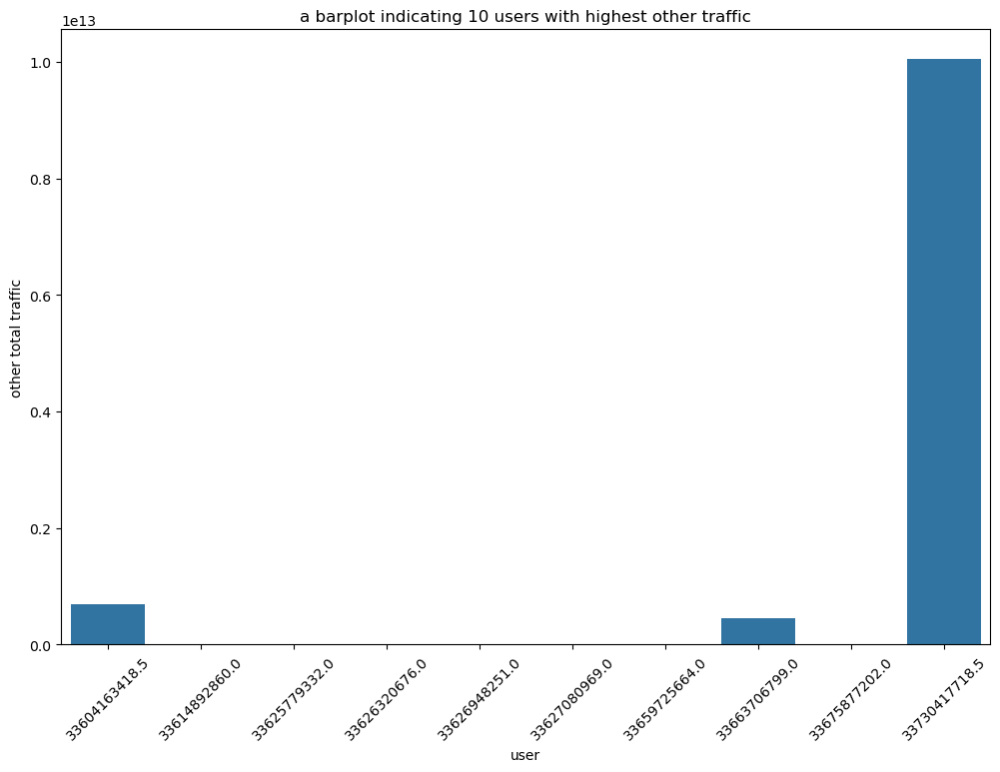

In [105]:
h = agg_apps_traffic.sort_values(by = 'other', ascending = False).head(10)
plt.figure(figsize = (12,8))
sns.barplot(x = h.index, y = h['other'])
plt.ylabel('other total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest other traffic')
plt.show()

In [106]:
# users in the 3 categories.
b = b.index.to_list()
c = c.index.to_list()
d = d.index.to_list()
e = e.index.to_list()
f = f.index.to_list()
g = g.index.to_list()
h = h.index.to_list()


def IntersecOfSets(arr1, arr2, arr3, arr4, arr5, arr6, arr7): 
    s1 = set(arr1) 
    s2 = set(arr2) 
    s3 = set(arr3) 
    s4 = set(arr4)
    s5 = set(arr5)
    s6 = set(arr6)
    s7 = set(arr7)

    set1 = s1.intersection(s2)
    set2 = set1.intersection(s3) 
    set3 = set2.intersection(s4)
    set4 = set3.intersection(s5) 
    set5 = set4.intersection(s6) 
    set6 = set5.intersection(s7) 
      
    final_list = list(set6) 
    print(final_list) 
  
IntersecOfSets(b, c, d, e, f, g, h) 

[33625779332.0, 33626320676.0, 33663706799.0, 33730417718.5, 33604163418.5, 33614892860.0]


### * Plot the top 3 most used applications.
Most used applications can be determined by the Application with highest traffic data or the application with the most users.


In [107]:
agg_apps_traffic.loc['total_app_traffic'] = agg_apps_traffic.sum()  
agg_apps_traffic.tail()

,social_media,netflix,youtube,gaming,google,email,other
MSISDN/Number,,,,,,,
33699999410.0,7.876170e+05,2.133642e+07,3.097622e+07,5.098622e+08,1.135828e+07,1.032177e+06,4.314203e+08
33699999495.0,1.279316e+06,2.257492e+07,1.885044e+07,4.226600e+08,1.037474e+07,1.396652e+06,3.962178e+08
33699999608.0,3.432270e+05,8.718765e+06,2.582723e+07,3.324118e+08,1.012454e+07,1.664834e+06,8.492620e+07
33730417718.5,4.270913e+10,5.289605e+11,5.297344e+11,9.964063e+12,1.821384e+11,5.283870e+10,1.005305e+13
total_app_traffic,2.742394e+11,3.394314e+12,3.396545e+12,6.455040e+13,1.171102e+12,3.388676e+11,6.440523e+13


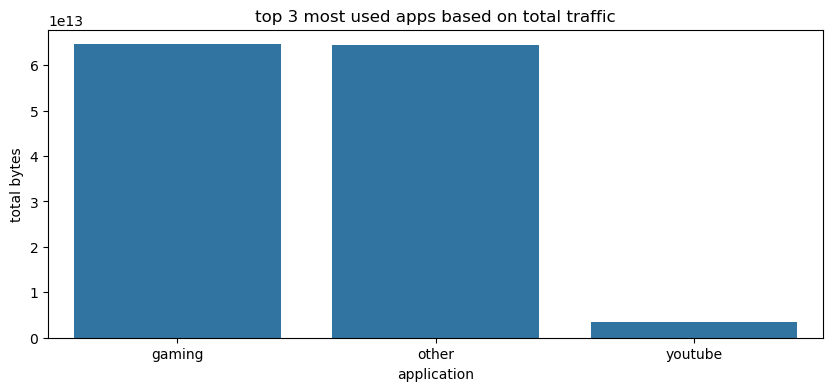

In [108]:
a = agg_apps_traffic.tail(1)
long_df = pd.melt(a)
long_df = long_df.sort_values(by = 'value', ascending = False).head(3)
plt.figure(figsize=(10,4))
sns.barplot(x = long_df.variable, y = long_df.value)
plt.title('top 3 most used apps based on total traffic')
plt.ylabel('total bytes')
plt.xlabel('application')
plt.show()

### * Using k-means clustering algorithm, group users in k engagement clusters based on the engagement metrics: 


In [109]:
# the user engagement metrics df (already normalized due to different units of measurement)
norm_agg_user_data = norm_agg_user_data.drop(['clusters'], axis = 1)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes)
MSISDN/Number,,,
3.360416e+10,7.397562,25.785040,27.420094
3.360417e+10,0.693147,17.891730,20.165202
3.360417e+10,1.098612,19.176760,20.690992
3.360418e+10,0.693147,18.662587,20.440147
3.360418e+10,0.693147,17.624969,19.422574


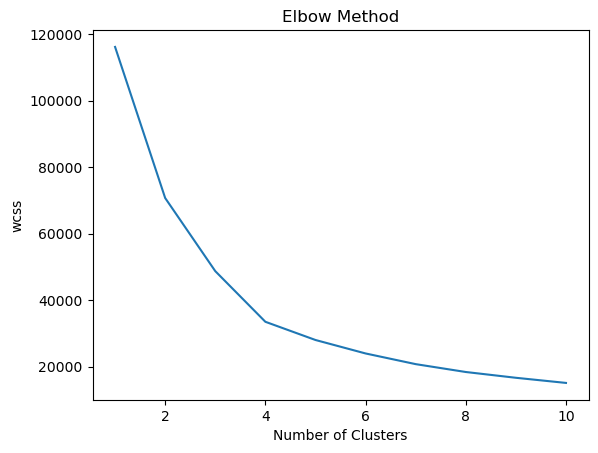

In [110]:
# determining number of clusters using elbow plot
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    kmeans.fit(norm_agg_user_data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('wcss')
plt.show()

**k=4**

In [111]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=10, random_state=0)
kmeans.fit(norm_agg_user_data)
y_means = kmeans.predict(norm_agg_user_data)
agg_user_data['clusters'] = y_means
# agg_user_data = agg_user_data.drop(['clusetrs'], axis = 1)
agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,1631,1.578704e+11,8.098334e+11,3
3.360417e+10,1,5.892230e+07,5.723161e+08,0
3.360417e+10,2,2.129908e+08,9.682418e+08,3
3.360418e+10,1,1.273675e+08,7.534301e+08,0
3.360418e+10,1,4.512601e+07,2.723432e+08,1


In [112]:
#clusters df
cluster_1 = agg_user_data[agg_user_data.clusters == 0]
cluster_2 = agg_user_data[agg_user_data.clusters == 1]
cluster_3 = agg_user_data[agg_user_data.clusters == 2]
cluster_4 = agg_user_data[agg_user_data.clusters == 3]

In [113]:
# descriptions
cluster_1.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,39223.000000,3.922300e+04,3.922300e+04,39223.0
mean,1.187008,1.204085e+08,6.796580e+08,0.0
std,0.396472,4.720682e+07,2.260927e+08,0.0
min,1.000000,4.338715e+07,3.296749e+08,0.0
25%,1.000000,8.639992e+07,5.085609e+08,0.0
50%,1.000000,1.039012e+08,6.593735e+08,0.0
75%,1.000000,1.524952e+08,8.093539e+08,0.0
max,4.000000,3.385277e+08,2.034468e+09,0.0


In [114]:
cluster_2.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,16390.000000,1.639000e+04,1.639000e+04,16390.0
mean,1.073276,2.894381e+07,5.524431e+08,1.0
std,0.261766,1.159460e+07,2.612248e+08,0.0
min,1.000000,7.146574e+06,4.604748e+07,1.0
25%,1.000000,1.936639e+07,3.498100e+08,1.0
50%,1.000000,2.820993e+07,5.422293e+08,1.0
75%,1.000000,3.715433e+07,7.420101e+08,1.0
max,3.000000,5.953446e+07,1.789204e+09,1.0


In [115]:
cluster_3.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,17360.000000,1.736000e+04,1.736000e+04,17360.0
mean,1.025576,1.183823e+08,2.068412e+08,2.0
std,0.158236,5.397360e+07,8.066171e+07,0.0
min,1.000000,1.864570e+07,3.324901e+07,2.0
25%,1.000000,8.639985e+07,1.365964e+08,2.0
50%,1.000000,9.910240e+07,2.063993e+08,2.0
75%,1.000000,1.514066e+08,2.769568e+08,2.0
max,3.000000,4.839601e+08,3.576273e+08,2.0


In [116]:
cluster_4.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,16119.000000,1.611900e+04,1.611900e+04,16119.0
mean,4.221602,4.766860e+08,2.175176e+09,3.0
std,184.275043,1.866876e+10,9.083432e+10,0.0
min,1.000000,6.659556e+07,2.970946e+08,3.0
25%,2.000000,2.017225e+08,9.608055e+08,3.0
50%,2.000000,2.619900e+08,1.251920e+09,3.0
75%,3.000000,3.530325e+08,1.624918e+09,3.0
max,23317.000000,2.364128e+12,1.149296e+13,3.0


## Task 3. Experience Analytics

Aggregate, per customer, the following information (treat missing & outliers by replacing by the mean or the mode of the corresponding variable) -(jupyter notebook):
Average TCP retransmission
Average RTT
Handset type
Average throughput


In [117]:
net_data = df[['MSISDN/Number', 'Handset Type', 'Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
                'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)']]

net_data.head()

,MSISDN/Number,Handset Type,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes)
0,3.366496e+10,Samsung Galaxy A5 Sm-A520F,42.0,5.0,23.0,44.0,568730.0,20949.5
1,3.368185e+10,Samsung Galaxy J5 (Sm-J530),65.0,5.0,16.0,26.0,568730.0,20949.5
2,3.373042e+10,Samsung Galaxy A8 (2018),45.0,5.0,6.0,9.0,568730.0,20949.5
3,3.373042e+10,undefined,45.0,5.0,44.0,44.0,568730.0,20949.5
4,3.369980e+10,Samsung Sm-G390F,45.0,5.0,6.0,9.0,568730.0,20949.5


In [118]:
# null values are already treated, let's check the outliers using IQR score

#check if the exist
# RTT DL
Q1 = np.percentile(net_data['Avg RTT DL (ms)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg RTT DL (ms)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg RTT DL (ms)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg RTT DL (ms)'], interpolation = 'midpoint') 
o = (net_data['Avg RTT DL (ms)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg RTT DL (ms)'] > (Q3 + 1.5 * IQR))
m = o.unique()

#RTT UL
Q1 = np.percentile(net_data['Avg RTT UL (ms)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg RTT UL (ms)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg RTT UL (ms)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg RTT UL (ms)'], interpolation = 'midpoint') 
o = (net_data['Avg RTT UL (ms)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg RTT UL (ms)'] > (Q3 + 1.5 * IQR))
n = o.unique()

#TP DL
Q1 = np.percentile(net_data['Avg Bearer TP DL (kbps)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg Bearer TP DL (kbps)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg Bearer TP DL (kbps)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg Bearer TP DL (kbps)'], interpolation = 'midpoint') 
o = (net_data['Avg Bearer TP DL (kbps)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg Bearer TP DL (kbps)'] > (Q3 + 1.5 * IQR))
q = o.unique()

#TP UL
Q1 = np.percentile(net_data['Avg Bearer TP UL (kbps)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg Bearer TP UL (kbps)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg Bearer TP UL (kbps)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg Bearer TP UL (kbps)'], interpolation = 'midpoint') 
o = (net_data['Avg Bearer TP UL (kbps)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg Bearer TP UL (kbps)'] > (Q3 + 1.5 * IQR))
p = o.unique()

#TCP UL
Q1 = np.percentile(net_data['TCP UL Retrans. Vol (Bytes)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['TCP UL Retrans. Vol (Bytes)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['TCP UL Retrans. Vol (Bytes)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['TCP UL Retrans. Vol (Bytes)'], interpolation = 'midpoint') 
o = (net_data['TCP UL Retrans. Vol (Bytes)'] < (Q1 - 1.5 * IQR)) |(net_data['TCP UL Retrans. Vol (Bytes)'] > (Q3 + 1.5 * IQR))
q = o.unique()

#TCP DL
Q1 = np.percentile(net_data['TCP DL Retrans. Vol (Bytes)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['TCP DL Retrans. Vol (Bytes)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['TCP DL Retrans. Vol (Bytes)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['TCP DL Retrans. Vol (Bytes)'], interpolation = 'midpoint') 
o = (net_data['TCP DL Retrans. Vol (Bytes)'] < (Q1 - 1.5 * IQR)) |(net_data['TCP DL Retrans. Vol (Bytes)'] > (Q3 + 1.5 * IQR))
r = o.unique()

print('rtt dl', m)
print('rtt ul', n)
print('tp ul', p)
print('tp dl', q)
print('tcp dl', r)
print('tcp ul', q)

rtt dl [False]
rtt ul [False]
tp ul [False]
tp dl [False  True]
tcp dl [False  True]
tcp ul [False  True]


They all have outliers, now we have to treat them by replacing them with the low and high percentiles.


In [119]:
net_data['Avg RTT DL (ms)'] = net_data['Avg RTT DL (ms)'].clip(lower=net_data['Avg RTT DL (ms)'].quantile(0.07), upper=net_data['Avg RTT DL (ms)'].quantile(0.93))
net_data['Avg RTT UL (ms)'] = net_data['Avg RTT UL (ms)'].clip(lower=net_data['Avg RTT UL (ms)'].quantile(0.10), upper=net_data['Avg RTT UL (ms)'].quantile(0.90))
net_data['Avg Bearer TP DL (kbps)'] = net_data['Avg Bearer TP DL (kbps)'].clip(lower=net_data['Avg Bearer TP DL (kbps)'].quantile(0.05), upper=net_data['Avg Bearer TP DL (kbps)'].quantile(0.95))
net_data['Avg Bearer TP UL (kbps)'] = net_data['Avg Bearer TP UL (kbps)'].clip(lower=net_data['Avg Bearer TP UL (kbps)'].quantile(0.20), upper=net_data['Avg Bearer TP UL (kbps)'].quantile(0.80))
net_data['TCP UL Retrans. Vol (Bytes)'] = net_data['TCP UL Retrans. Vol (Bytes)'].clip(lower=net_data['TCP UL Retrans. Vol (Bytes)'].quantile(0.05), upper=net_data['TCP UL Retrans. Vol (Bytes)'].quantile(0.95))
net_data['TCP DL Retrans. Vol (Bytes)'] = net_data['TCP DL Retrans. Vol (Bytes)'].clip(lower=net_data['TCP DL Retrans. Vol (Bytes)'].quantile(0.05), upper=net_data['TCP DL Retrans. Vol (Bytes)'].quantile(0.95))

In [120]:
# Confirming they've been treated
# RTT DL
Q1 = np.percentile(net_data['Avg RTT DL (ms)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg RTT DL (ms)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg RTT DL (ms)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg RTT DL (ms)'], interpolation = 'midpoint') 
o = (net_data['Avg RTT DL (ms)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg RTT DL (ms)'] > (Q3 + 1.5 * IQR))
m = o.unique()

#RTT UL
Q1 = np.percentile(net_data['Avg RTT UL (ms)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg RTT UL (ms)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg RTT UL (ms)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg RTT UL (ms)'], interpolation = 'midpoint') 
o = (net_data['Avg RTT UL (ms)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg RTT UL (ms)'] > (Q3 + 1.5 * IQR))
n = o.unique()

#TP DL
Q1 = np.percentile(net_data['Avg Bearer TP DL (kbps)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg Bearer TP DL (kbps)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg Bearer TP DL (kbps)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg Bearer TP DL (kbps)'], interpolation = 'midpoint') 
o = (net_data['Avg Bearer TP DL (kbps)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg Bearer TP DL (kbps)'] > (Q3 + 1.5 * IQR))
q = o.unique()

#TP UL
Q1 = np.percentile(net_data['Avg Bearer TP UL (kbps)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['Avg Bearer TP UL (kbps)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['Avg Bearer TP UL (kbps)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['Avg Bearer TP UL (kbps)'], interpolation = 'midpoint') 
o = (net_data['Avg Bearer TP UL (kbps)'] < (Q1 - 1.5 * IQR)) |(net_data['Avg Bearer TP UL (kbps)'] > (Q3 + 1.5 * IQR))
p = np.unique(o, return_counts = True)

#TCP UL
Q1 = np.percentile(net_data['TCP UL Retrans. Vol (Bytes)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['TCP UL Retrans. Vol (Bytes)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['TCP UL Retrans. Vol (Bytes)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['TCP UL Retrans. Vol (Bytes)'], interpolation = 'midpoint') 
o = (net_data['TCP UL Retrans. Vol (Bytes)'] < (Q1 - 1.5 * IQR)) |(net_data['TCP UL Retrans. Vol (Bytes)'] > (Q3 + 1.5 * IQR))
q = o.unique()

#TCP DL
Q1 = np.percentile(net_data['TCP DL Retrans. Vol (Bytes)'], 25, interpolation = 'midpoint')  
Q2 = np.percentile(net_data['TCP DL Retrans. Vol (Bytes)'], 50, interpolation = 'midpoint')  
Q3 = np.percentile(net_data['TCP DL Retrans. Vol (Bytes)'], 75, interpolation = 'midpoint')  
IQR = stats.iqr(net_data['TCP DL Retrans. Vol (Bytes)'], interpolation = 'midpoint') 
o = (net_data['TCP DL Retrans. Vol (Bytes)'] < (Q1 - 1.5 * IQR)) |(net_data['TCP DL Retrans. Vol (Bytes)'] > (Q3 + 1.5 * IQR))
r = o.unique()

print('rtt dl', m)
print('rtt ul', n)
print('tp ul', p)
print('tp dl', q)
print('tcp dl', r)
print('tcp ul', q)

rtt dl [False]
rtt ul [False]
tp ul (array([False]), array([150001], dtype=int64))
tp dl [False  True]
tcp dl [False  True]
tcp ul [False  True]


All good now.

In [121]:
# # replacing with mean
# mean = float(net_data['Avg Bearer TP UL (kbps)'].mean())
# lower=net_data['Avg Bearer TP UL (kbps)'].quantile(0.10)
# upper=net_data['Avg Bearer TP UL (kbps)'].quantile(0.90)
# net_data['Avg Bearer TP UL (kbps)'] = np.where((net_data['Avg Bearer TP UL (kbps)']  > upper), mean, net_data['Avg Bearer TP UL (kbps)'])
# net_data['Avg Bearer TP UL (kbps)'] = np.where((net_data['Avg Bearer TP UL (kbps)']  < lower), mean, net_data['Avg Bearer TP UL (kbps)'])

In [122]:
# generate total columns for rtt, tp and tcp
net_data['total_tp(kbps)'] = df['Avg Bearer TP DL (kbps)'] + df['Avg Bearer TP UL (kbps)']
net_data['total_rtt(ms)'] = df['Avg RTT DL (ms)'] + df['Avg RTT UL (ms)']
net_data['total_tcp(bytes)'] = df['TCP DL Retrans. Vol (Bytes)'] + df['TCP UL Retrans. Vol (Bytes)']
net_data.head()

,MSISDN/Number,Handset Type,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),total_tp(kbps),total_rtt(ms),total_tcp(bytes)
0,3.366496e+10,Samsung Galaxy A5 Sm-A520F,42.0,5.0,23.0,45.0,568730.0,20949.5,67.0,47.0,589679.5
1,3.368185e+10,Samsung Galaxy J5 (Sm-J530),65.0,5.0,16.0,45.0,568730.0,20949.5,42.0,70.0,589679.5
2,3.373042e+10,Samsung Galaxy A8 (2018),45.0,5.0,11.0,45.0,568730.0,20949.5,15.0,50.0,589679.5
3,3.373042e+10,undefined,45.0,5.0,44.0,45.0,568730.0,20949.5,88.0,50.0,589679.5
4,3.369980e+10,Samsung Sm-G390F,45.0,5.0,11.0,45.0,568730.0,20949.5,15.0,50.0,589679.5


In [123]:
# aggregating

# handset type
a = net_data[['MSISDN/Number', 'Handset Type']]
b = a.groupby('MSISDN/Number').count()
print(b.shape)
b = b.reset_index()
b.head()

(89092, 1)


,MSISDN/Number,Handset Type
0,3.360416e+10,1631
1,3.360417e+10,1
2,3.360417e+10,2
3,3.360418e+10,1
4,3.360418e+10,1


In [124]:
# the others
c = net_data.drop(['Handset Type'], axis = 1)
d = c.groupby('MSISDN/Number').sum()
d = d.reset_index()
print(d.shape)
d.head()

(89092, 10)


,MSISDN/Number,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),total_tp(kbps),total_rtt(ms),total_tcp(bytes)
0,3.360416e+10,79346.5,9946.0,12735598.5,615410.0,1.577275e+09,42953450.0,13531845.5,88691.5,2.817961e+09
1,3.360417e+10,45.0,5.0,25.0,47.0,5.687300e+05,20949.5,72.0,50.0,5.896795e+05
2,3.360417e+10,118.0,11.0,46253.0,1193.0,6.943320e+05,64822.5,47446.0,129.0,7.591545e+05
3,3.360418e+10,78.0,5.0,23.0,45.0,5.687300e+05,20949.5,67.0,83.0,5.896795e+05
4,3.360418e+10,65.0,5.0,183.0,45.0,5.687300e+05,20949.5,226.0,70.0,5.896795e+05


In [125]:
# Merging them
agg_net_data = pd.merge(left=b, right=d, how='left', left_on='MSISDN/Number', right_on='MSISDN/Number')
print(agg_net_data.shape)
agg_net_data.head()

(89092, 11)


,MSISDN/Number,Handset Type,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),total_tp(kbps),total_rtt(ms),total_tcp(bytes)
0,3.360416e+10,1631,79346.5,9946.0,12735598.5,615410.0,1.577275e+09,42953450.0,13531845.5,88691.5,2.817961e+09
1,3.360417e+10,1,45.0,5.0,25.0,47.0,5.687300e+05,20949.5,72.0,50.0,5.896795e+05
2,3.360417e+10,2,118.0,11.0,46253.0,1193.0,6.943320e+05,64822.5,47446.0,129.0,7.591545e+05
3,3.360418e+10,1,78.0,5.0,23.0,45.0,5.687300e+05,20949.5,67.0,83.0,5.896795e+05
4,3.360418e+10,1,65.0,5.0,183.0,45.0,5.687300e+05,20949.5,226.0,70.0,5.896795e+05


### Compute & list 10 of the top, bottom:
* TCP values in the dataset. 
* RTT values in the dataset.
* Throughput values in the dataset.


In [126]:
#tcp
tcp = df.sort_values(by = 'total_tcp', ascending = False)
top_tcp = tcp.total_tcp.head(10)
bottom_tcp = tcp.total_tcp.tail(10)
fre_tcp = df.total_tcp.value_counts(ascending = False).head(10)
print('top tcp\n', top_tcp.to_list())
print('bottom tcp\n', bottom_tcp.to_list())
print('freq tcp\n', fre_tcp.index.to_list())

top tcp
 [4344115651.0, 4301477439.0, 4294431965.0, 4291464950.0, 4288120860.0, 4275491713.0, 4268647350.0, 4261616039.0, 4260174145.0, 4254659643.0]
bottom tcp
 [143.0, 134.0, 134.0, 129.0, 128.0, 113.0, 108.0, 106.0, 97.0, 86.0]
freq tcp
 [589679.5, 570024.0, 22279.5, 570060.0, 20987.5, 570048.0, 21041.5, 23609.5, 22267.5, 571390.0]


In [127]:
#rtt
rtt = df.sort_values(by = 'total_rtt', ascending = False)
top_rtt= rtt.total_rtt.head(10)
bottom_rtt = rtt.total_rtt.tail(10)
fre_rtt = df.total_rtt.value_counts(ascending = False).head(10)
print('top rtt\n', top_rtt.to_list())
print('bottom rtt\n', bottom_rtt.to_list())
print('freq rtt\n', fre_rtt.index.to_list())

top rtt
 [125.5, 125.5, 125.5, 125.5, 125.5, 125.5, 125.5, 125.5, 125.5, 125.5]
bottom rtt
 [6.0, 6.0, 5.0, 4.0, 4.0, 2.0, 0.0, 0.0, 0.0, 0.0]
freq rtt
 [50.0, 125.5, 29.0, 39.0, 38.0, 40.0, 30.0, 28.0, 49.0, 41.0]


In [128]:
tp = df.sort_values(by = 'total_tp', ascending = False)
top_tp = tp.total_tp.head(10)
bottom_tp = tp.total_tp.tail(10)
fre_tp = df.total_tp.value_counts(ascending = False).head(10)
print('top tp\n', top_tp.to_list())
print('bottom tp\n', bottom_tp.to_list())
print('freq tp\n', fre_tp.index.to_list())

top tp
 [51940.0, 51940.0, 51940.0, 51940.0, 51940.0, 51940.0, 51940.0, 51940.0, 51940.0, 51940.0]
bottom tp
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
freq tp
 [51940.0, 63.0, 15.0, 97.0, 90.0, 98.0, 96.0, 99.0, 89.0, 91.0]


In [129]:
# user-based plots on the same

# tcp
a = agg_net_data.sort_values(by = 'total_tcp(bytes)', ascending = False).head(10)
b = agg_net_data.sort_values(by = 'total_tcp(bytes)', ascending = False).tail(10)
c = pd.DataFrame(agg_net_data['total_tcp(bytes)'].value_counts(ascending = False).head(10))

[Text(0.5, 1.0, 'Top 10 TCP values'), Text(0.5, 0, 'users')]

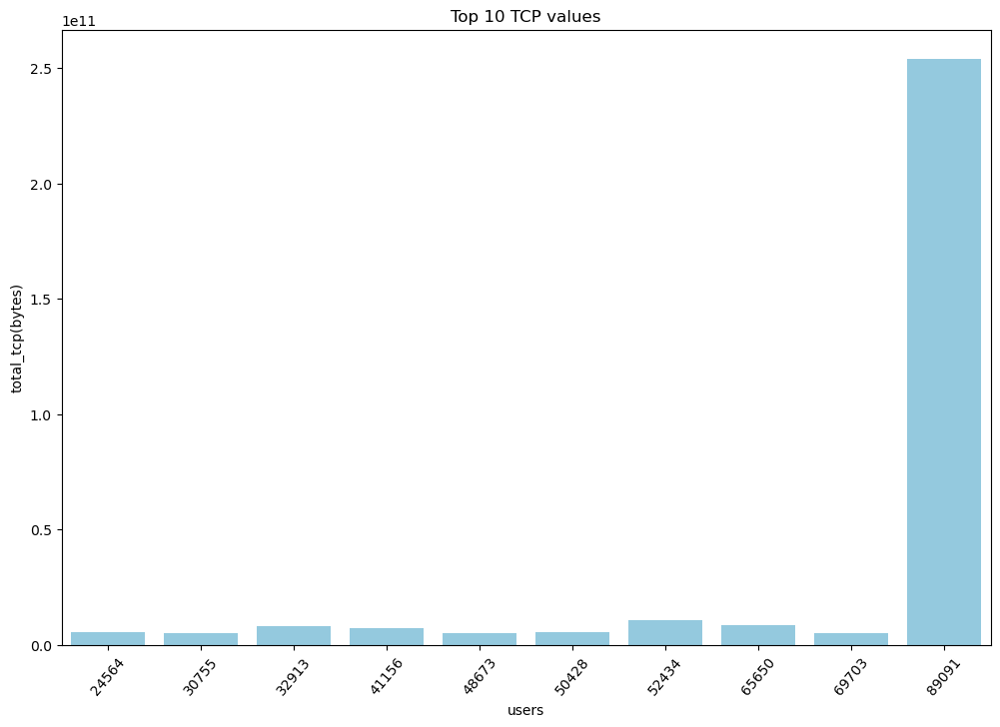

In [130]:
# top 10
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = a.index ,y = a['total_tcp(bytes)'], color="skyblue").set(title = 'Top 10 TCP values', xlabel = 'users')

[Text(0.5, 1.0, 'Bottom 10 TCP values'), Text(0.5, 0, 'users')]

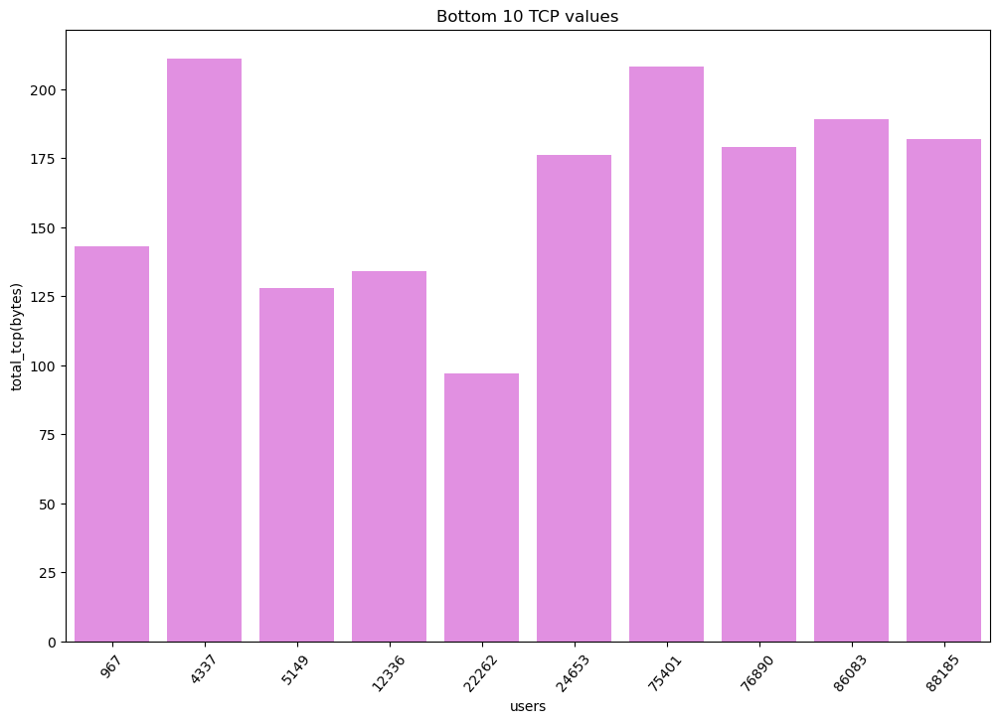

In [131]:
# bottom 10
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = b.index ,y = b['total_tcp(bytes)'], color="violet").set(title = 'Bottom 10 TCP values', xlabel = 'users')

In [132]:
# rtt
a = agg_net_data.sort_values(by = 'total_rtt(ms)', ascending = False).head(10)
b = agg_net_data.sort_values(by = 'total_rtt(ms)', ascending = False).tail(10)
c = pd.DataFrame(agg_net_data['total_rtt(ms)'].value_counts(ascending = False).head(10))

[Text(0.5, 1.0, 'Top 10 rtt values'), Text(0.5, 0, 'users')]

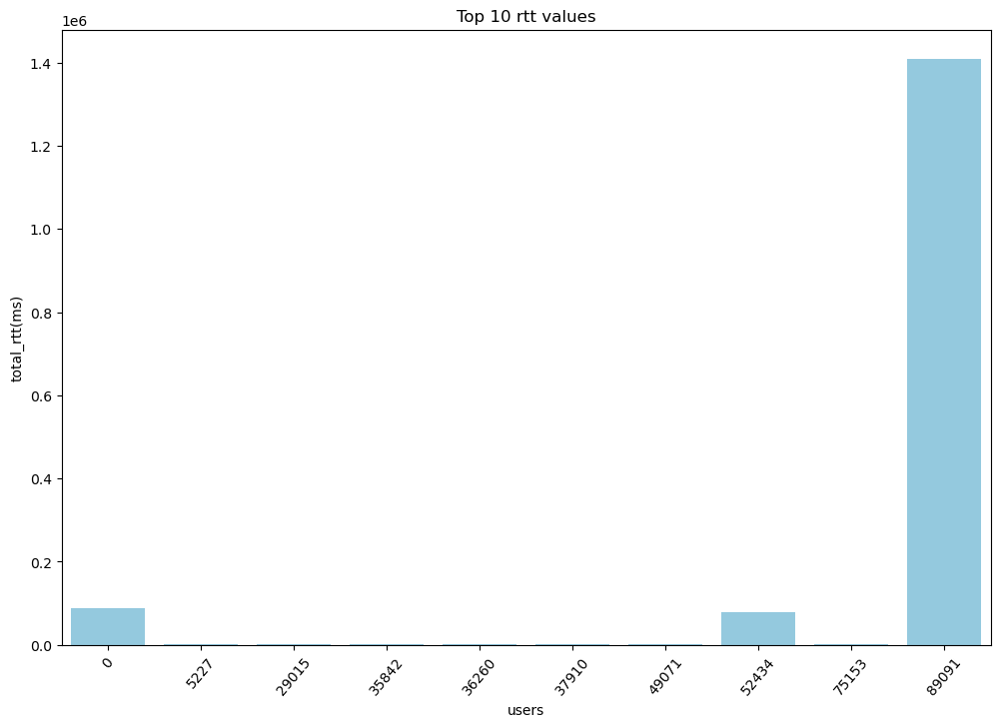

In [133]:
# top 10
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = a.index ,y = a['total_rtt(ms)'], color="skyblue").set(title = 'Top 10 rtt values', xlabel = 'users')

[Text(0.5, 1.0, 'Bottom 10 rtt values'), Text(0.5, 0, 'users')]

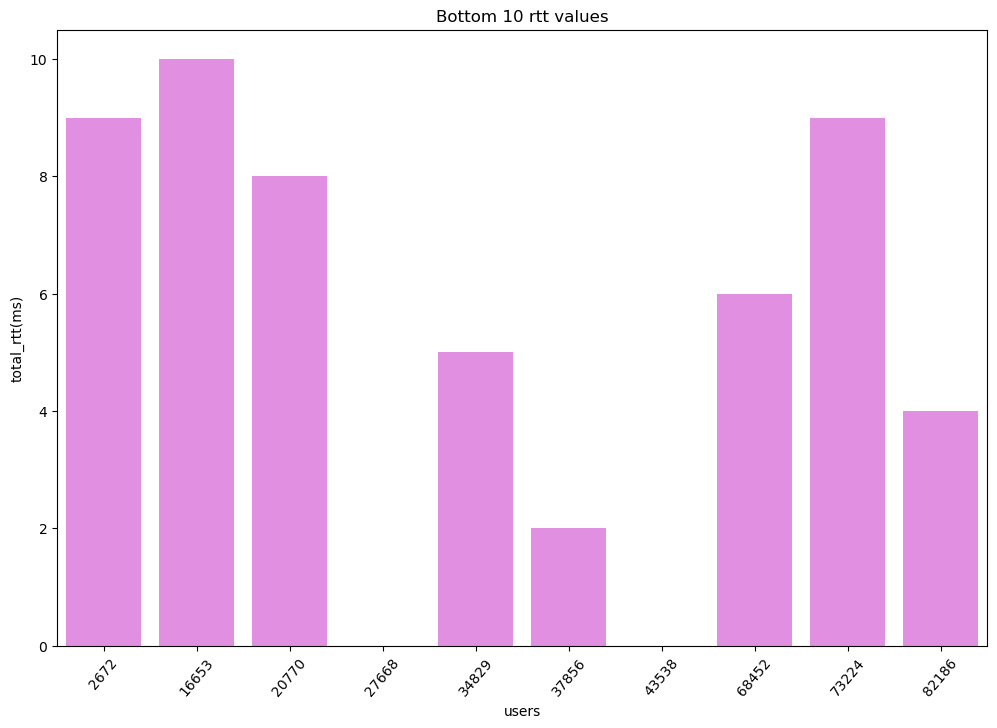

In [134]:
# bottom 10
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = b.index ,y = b['total_rtt(ms)'], color="violet").set(title = 'Bottom 10 rtt values', xlabel = 'users')

In [135]:
# tp
a = agg_net_data.sort_values(by = 'total_tp(kbps)', ascending = False).head(10)
b = agg_net_data.sort_values(by = 'total_tp(kbps)', ascending = False).tail(10)
c = pd.DataFrame(agg_net_data['total_tp(kbps)'].value_counts(ascending = False).head(10))

[Text(0.5, 1.0, 'Top 10 tp values'), Text(0.5, 0, 'users')]

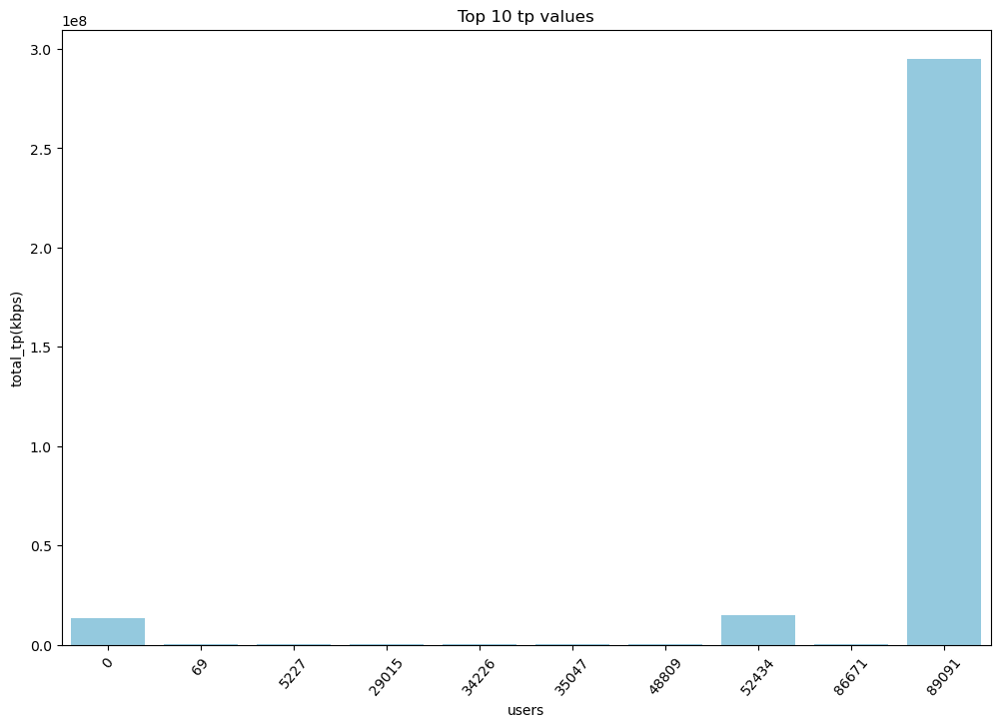

In [136]:
# top 10
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = a.index ,y = a['total_tp(kbps)'], color="skyblue").set(title = 'Top 10 tp values', xlabel = 'users')

[Text(0.5, 1.0, 'Bottom 10 tp values'), Text(0.5, 0, 'users')]

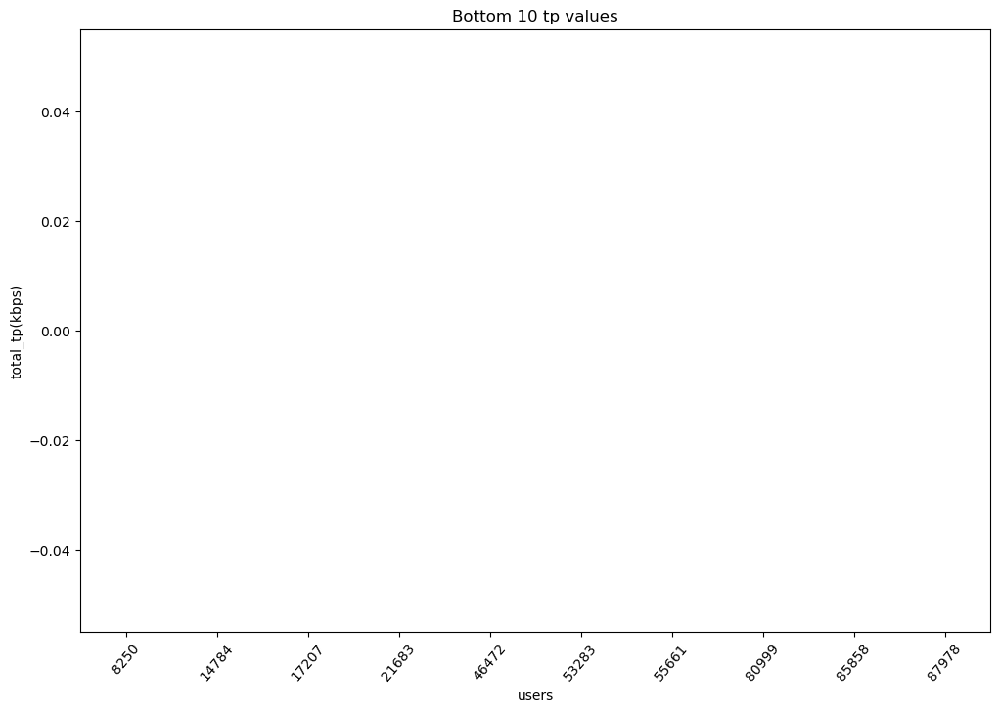

In [137]:
# bottom 10
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = b.index ,y = b['total_tp(kbps)'], color="violet").set(title = 'Bottom 10 tp values', xlabel = 'users')

all zeros.

### Compute & report:
* The distribution of the average throughput  per handset type and provide interpretation for your findings.
* The average TCP retransmission view per handset type and provide interpretation for your findings.

In [138]:
df['total_tp(kbps)'] = df['Avg Bearer TP DL (kbps)'] + df['Avg Bearer TP UL (kbps)']
df['total_rtt(ms)'] = df['Avg RTT DL (ms)'] + df['Avg RTT UL (ms)']
df['total_tcp(bytes)'] = df['TCP DL Retrans. Vol (Bytes)'] + df['TCP UL Retrans. Vol (Bytes)']

handset_data = df[['Handset Type', 'total_tp(kbps)', 'total_tcp(bytes)']]
agg_handset_data = handset_data.groupby('Handset Type').mean()
agg_handset_data.columns = ['avg_tp_per_set', 'avg_tcp_per_set']
agg_handset_data.head()

,avg_tp_per_set,avg_tcp_per_set
Handset Type,,
A-Link Telecom I. Cubot A5,23510.0,589679.5
A-Link Telecom I. Cubot Note Plus,6699.0,616213.0
A-Link Telecom I. Cubot Note S,8937.0,41411731.0
A-Link Telecom I. Cubot Nova,49760.5,137170.0
A-Link Telecom I. Cubot Power,49552.5,8041.0



 mu = 10934.61 and sigma = 11541.38



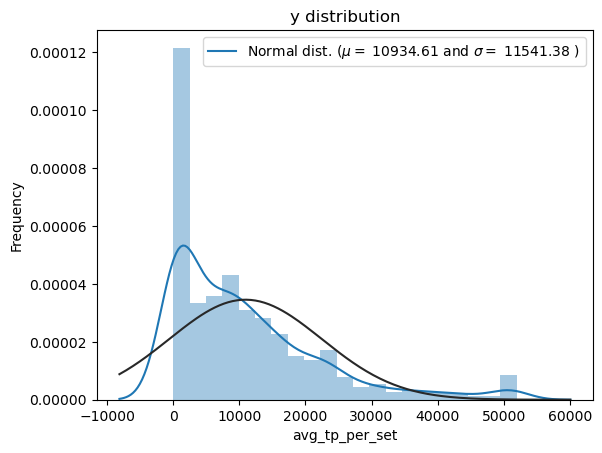

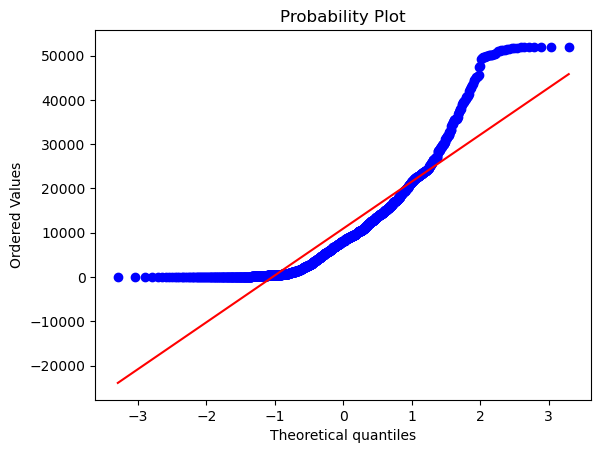

In [139]:
# Average throughput/handset ~ distribution
sns.distplot(agg_handset_data['avg_tp_per_set'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(agg_handset_data['avg_tp_per_set'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('y distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(agg_handset_data['avg_tp_per_set'], plot=plt)
plt.show()

### Heavily right tailed - Highly skewed.

[Text(0.5, 1.0, 'Top 10 handsets types per average tcp value'),
 Text(0.5, 0, 'handset type')]

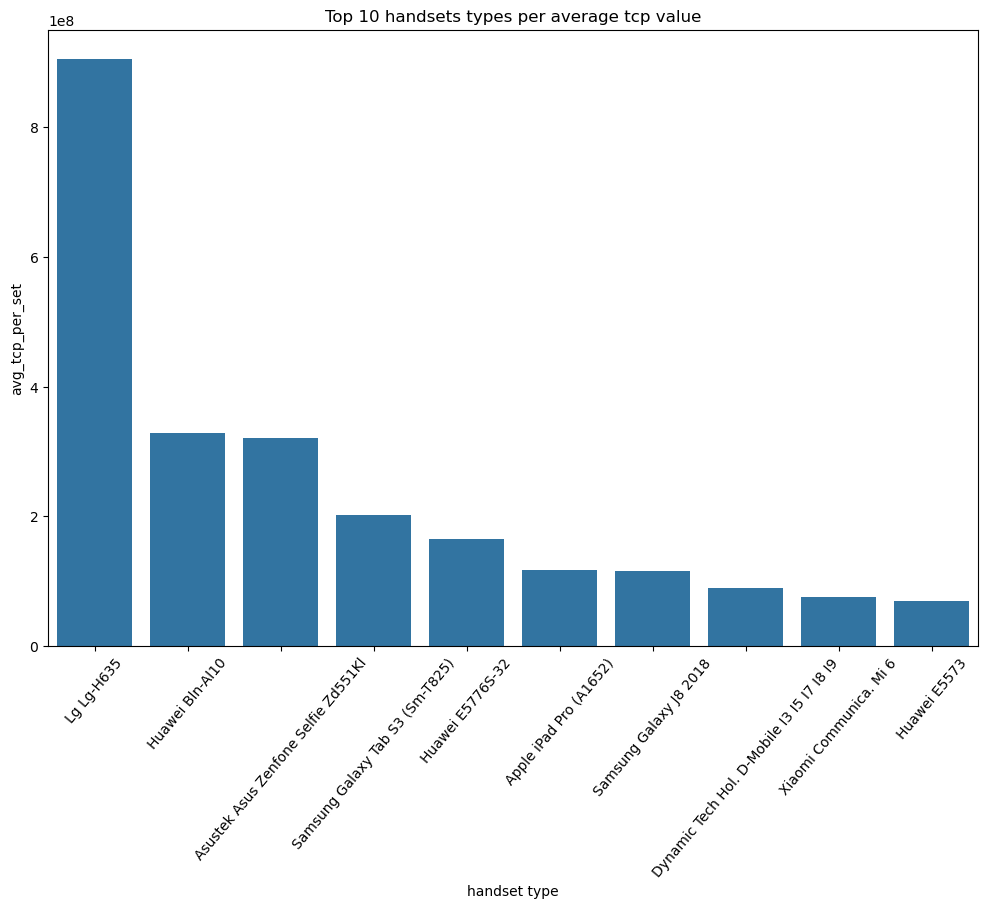

In [140]:
# The average TCP retransmission view per handset type and provide interpretation for your findings.
# aggregate function has already been applied 

# top 10 handsets per tcp average
a = agg_handset_data.sort_values(by = 'avg_tcp_per_set', ascending = False).head(10)
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = a.index ,y = a['avg_tcp_per_set']).set(title = 'Top 10 handsets types per average tcp value', xlabel = 'handset type')

#### 6 of the handset types with highest average tcp values are from the top 3 handset manufacturers.

[Text(0.5, 1.0, 'Bottom 10 handsets types per average tcp value'),
 Text(0.5, 0, 'handset type')]

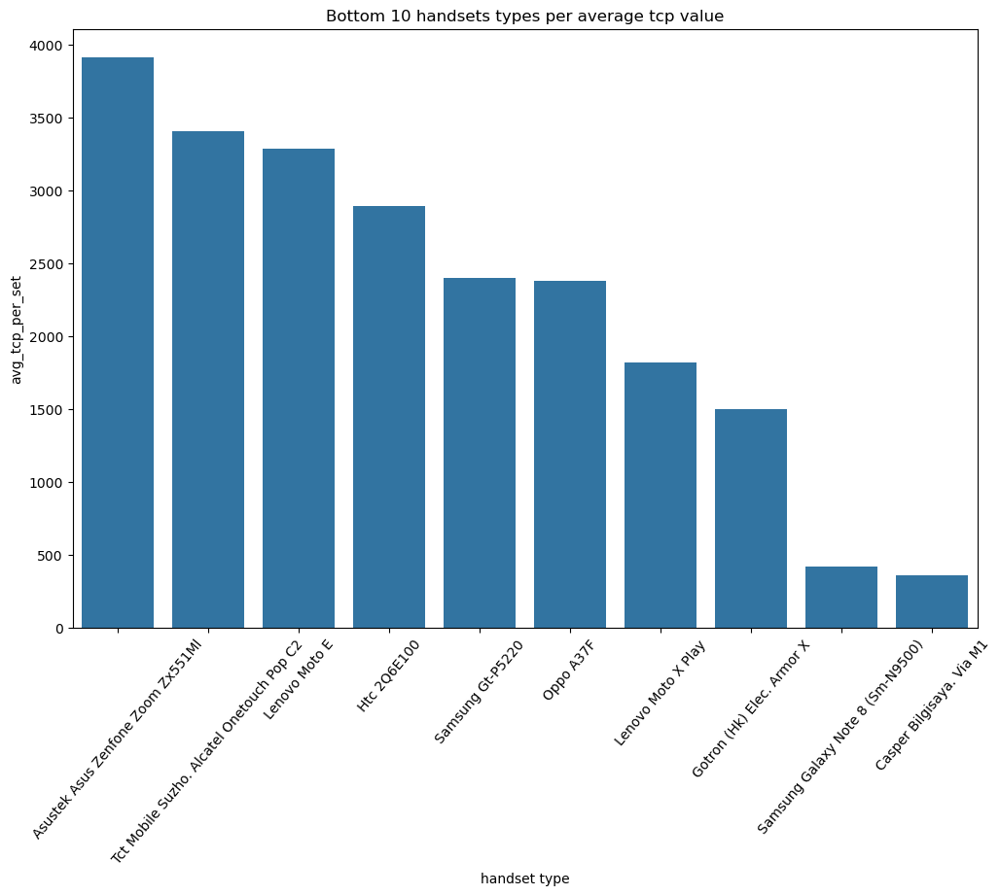

In [141]:
# bottom 10 handsets per tcp average
b = agg_handset_data.sort_values(by = 'avg_tcp_per_set', ascending = False).tail(10)
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = b.index ,y = b['avg_tcp_per_set']).set(title = 'Bottom 10 handsets types per average tcp value', xlabel = 'handset type')

### Using the experience metrics above, perform a k-means clustering (where k = 3) to segment users into groups of experiences and provide a brief description of each cluster.

In [142]:
cluster_data = agg_net_data[['Handset Type', 'total_tp(kbps)', 'total_rtt(ms)',  'total_tcp(bytes)']]
norm_cluster_data = np.log1p(cluster_data)   #log transformation
norm_cluster_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes)
0,7.397562,16.420556,11.392931,21.759279
1,0.693147,4.290459,3.931826,13.287336
2,1.098612,10.767369,4.867534,13.539962
3,0.693147,4.219508,4.430817,13.287336
4,0.693147,5.424950,4.262680,13.287336


In [143]:
# kmeans on 3 clusters.
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
kmeans.fit(norm_cluster_data)
kmeans_data = kmeans.predict(norm_cluster_data)

In [144]:
# add the predicted clusters as a column in the df
cluster_data['clusters'] = pd.Series(kmeans_data, index=cluster_data.index)
cluster_data['clusters'] = pd.Series(kmeans_data, index=cluster_data.index)
cluster_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),clusters
0,1631,13531845.5,88691.5,2.817961e+09,1
1,1,72.0,50.0,5.896795e+05,2
2,2,47446.0,129.0,7.591545e+05,1
3,1,67.0,83.0,5.896795e+05,2
4,1,226.0,70.0,5.896795e+05,2


In [145]:
#clusters df
cluster_1 = cluster_data[cluster_data.clusters == 0]
cluster_2 = cluster_data[cluster_data.clusters == 1]
cluster_3 = cluster_data[cluster_data.clusters == 2]

In [146]:
# understand the clusters
cluster_1.describe()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),clusters
count,13731.000000,13731.000000,13731.000000,13731.000000,13731.0
mean,1.078873,16492.749399,70.018134,161064.326233,0.0
std,0.285046,17111.767742,33.045438,199596.414678,0.0
min,1.000000,97.000000,18.000000,97.000000,0.0
25%,1.000000,3086.000000,45.000000,22483.500000,0.0
50%,1.000000,9534.000000,60.000000,58959.000000,0.0
75%,1.000000,25921.000000,101.000000,227816.000000,0.0
max,5.000000,206392.000000,612.500000,915852.000000,0.0


In [147]:
cluster_2.describe()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),clusters
count,27056.000000,2.705600e+04,2.705600e+04,2.705600e+04,27056.0
mean,2.862249,5.687165e+04,1.939391e+02,4.959878e+07,1.0
std,142.241135,1.797260e+06,8.593666e+03,1.568626e+09,0.0
min,1.000000,6.600000e+02,1.900000e+01,2.294720e+05,1.0
25%,1.000000,2.043775e+04,8.100000e+01,9.436844e+05,1.0
50%,2.000000,3.928975e+04,1.090000e+02,2.230420e+06,1.0
75%,2.000000,5.194000e+04,1.505000e+02,8.462770e+06,1.0
max,23317.000000,2.949174e+08,1.408603e+06,2.538960e+11,1.0


In [148]:
cluster_3.describe()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),clusters
count,48305.000000,48305.000000,48305.000000,4.830500e+04,48305.0
mean,1.195446,155.393914,57.443049,7.396001e+05,2.0
std,0.495379,205.320572,33.602384,1.426352e+06,0.0
min,1.000000,0.000000,0.000000,3.862000e+03,2.0
25%,1.000000,78.000000,38.000000,5.896795e+05,2.0
50%,1.000000,100.000000,50.000000,5.896795e+05,2.0
75%,1.000000,133.000000,62.000000,5.896795e+05,2.0
max,9.000000,2015.000000,511.000000,1.993377e+08,2.0


## Task 4. Satisfaction Analysis

### Write a python program to assign:
* engagement score to each user. Consider the engagement score as the Euclidean distance between the user data point & the less engaged cluster (use the first clustering for this).

In [149]:
norm_agg_user_data['clusters'] = pd.Series(kmeans_data, index=norm_agg_user_data.index)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,7.397562,25.785040,27.420094,1
3.360417e+10,0.693147,17.891730,20.165202,2
3.360417e+10,1.098612,19.176760,20.690992,1
3.360418e+10,0.693147,18.662587,20.440147,2
3.360418e+10,0.693147,17.624969,19.422574,2


In [150]:
norm_agg_user_data.clusters.value_counts()

clusters
2    48305
1    27056
0    13731
Name: count, dtype: int64

In [151]:
norm_agg_user_data.shape

(89092, 4)

Cluster 0 is the less engaged cluster, with the lowest count of 19362 data points.
* **engagement_score = euclidean_dist between a datapoint and cluster's 2 centroid.**

In [152]:
data1 = norm_agg_user_data.drop(['clusters'], axis = 1)
km = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
alldistances = km.fit_transform(data1) #returns euclidean distance btwn all datapoints and each cluster centroid
dist_df = pd.DataFrame(alldistances)
dist_2 = dist_df.iloc[:, 0].to_list() #pick out the centroid 2 distances
print(len(dist_2))
dist_2[:10]

89092


[11.436165057974275,
 1.3678438723892965,
 0.10260930310377249,
 0.6053554381757381,
 1.9712755469800043,
 1.8817548807298066,
 1.7788102387698932,
 2.807476479758368,
 1.8264956608554577,
 1.8779232860194601]

In [153]:
# add the distances as engagement score column

In [154]:
norm_agg_user_data['engagement_score'] = dist_2
eng_scores_data = norm_agg_user_data.drop(['clusters'], axis = 1)
eng_scores_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),engagement_score
MSISDN/Number,,,,
3.360416e+10,7.397562,25.785040,27.420094,11.436165
3.360417e+10,0.693147,17.891730,20.165202,1.367844
3.360417e+10,1.098612,19.176760,20.690992,0.102609
3.360418e+10,0.693147,18.662587,20.440147,0.605355
3.360418e+10,0.693147,17.624969,19.422574,1.971276


* experience score to each user. Consider the experience score as the Euclidean distance between the user data point & the worst experience’s cluster.

In [155]:
# picking out the 4 cols
exp_data = net_data.drop(['Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 
                          'Avg Bearer TP UL (kbps)', 'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)'], axis = 1)
exp_data.head()

,MSISDN/Number,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes)
0,3.366496e+10,Samsung Galaxy A5 Sm-A520F,67.0,47.0,589679.5
1,3.368185e+10,Samsung Galaxy J5 (Sm-J530),42.0,70.0,589679.5
2,3.373042e+10,Samsung Galaxy A8 (2018),15.0,50.0,589679.5
3,3.373042e+10,undefined,88.0,50.0,589679.5
4,3.369980e+10,Samsung Sm-G390F,15.0,50.0,589679.5


In [156]:
# groupby user
agg_exp_data = exp_data.groupby('MSISDN/Number').agg({'Handset Type':'count', 'total_tp(kbps)':'sum', 'total_rtt(ms)':'sum', 'total_tcp(bytes)':'sum'})
agg_exp_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes)
MSISDN/Number,,,,
3.360416e+10,1631,13531845.5,88691.5,2.817961e+09
3.360417e+10,1,72.0,50.0,5.896795e+05
3.360417e+10,2,47446.0,129.0,7.591545e+05
3.360418e+10,1,67.0,83.0,5.896795e+05
3.360418e+10,1,226.0,70.0,5.896795e+05


In [157]:
# normalize and perform kmeans
norm_agg_exp_data = np.log1p(agg_exp_data)
norm_agg_exp_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes)
MSISDN/Number,,,,
3.360416e+10,7.397562,16.420556,11.392931,21.759279
3.360417e+10,0.693147,4.290459,3.931826,13.287336
3.360417e+10,1.098612,10.767369,4.867534,13.539962
3.360418e+10,0.693147,4.219508,4.430817,13.287336
3.360418e+10,0.693147,5.424950,4.262680,13.287336


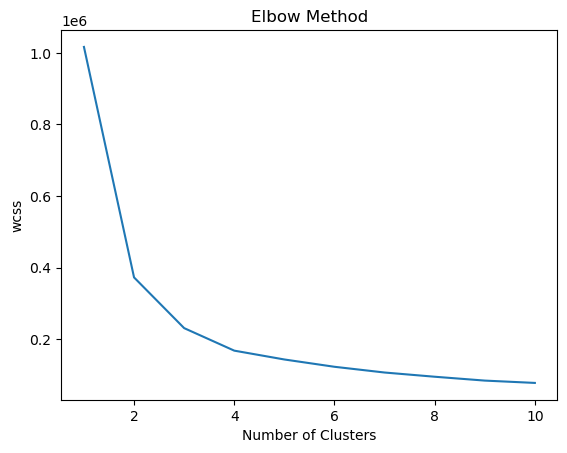

In [158]:
# determining number of clusters using elbow plot
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    kmeans.fit(norm_agg_exp_data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('wcss')
plt.show()

k = 3

In [159]:
# fit kmeans and identify least engaged cluster
k_means = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
k_means.fit(norm_agg_exp_data)
clusters=k_means.predict(norm_agg_exp_data)

norm_agg_exp_data['clusters'] = clusters
norm_agg_exp_data.clusters.value_counts()

clusters
2    48305
1    27056
0    13731
Name: count, dtype: int64

cluster 2 has the least.
*** exp_score = euclidean distance between datapoints and cluster 1's centroid**

In [160]:
# fit kmeans
data1 = norm_agg_exp_data.drop(['clusters'], axis = 1)

km = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
alldistances = km.fit_transform(data1) #returns euclidean distance btwn all datapoints to each cluster centroid

dist_df = pd.DataFrame(alldistances)
dist_0 = dist_df.iloc[:, 2].to_list() #pick out the centroid 0 distances
print(len(dist_0))
dist_0[:10]

89092


[17.556219584541207,
 0.38657867960242187,
 6.185918923418073,
 0.6661530801560408,
 0.8330754726921852,
 3.3123184441385423,
 4.091723433366124,
 0.36424393868215876,
 4.085054068827156,
 0.2786931103116349]

In [161]:
# add the scores to the df
norm_agg_exp_data['experience_score'] = dist_0
exp_scores_data = norm_agg_exp_data.drop(['clusters'], axis = 1)
exp_scores_data.tail()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),experience_score
MSISDN/Number,,,,,
3.370000e+10,0.693147,2.772589,3.931826,13.287336,1.892663
3.370000e+10,0.693147,8.406485,4.740575,13.705156,3.844082
3.370000e+10,0.693147,9.011035,3.401197,10.230468,5.386340
3.370000e+10,0.693147,2.772589,3.931826,13.287336,1.892663
3.373042e+10,10.056981,19.502206,14.158110,26.260190,24.025379


In [162]:
print(exp_scores_data.shape)
print(eng_scores_data.shape)

(89092, 5)
(89092, 4)


### Merge the engagement and experience datasets

In [163]:
exp_scores_data = exp_scores_data.reset_index()
eng_scores_data = eng_scores_data.reset_index()
avg_score_df = pd.merge(left = exp_scores_data, right = eng_scores_data, left_on = 'MSISDN/Number', right_on = 'MSISDN/Number')
print(avg_score_df.shape)
avg_score_df.tail()

(89092, 10)


,MSISDN/Number,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),experience_score,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),engagement_score
89087,3.370000e+10,0.693147,2.772589,3.931826,13.287336,1.892663,0.693147,18.961102,20.533814,0.383019
89088,3.370000e+10,0.693147,8.406485,4.740575,13.705156,3.844082,0.693147,16.066684,20.186098,3.112273
89089,3.370000e+10,0.693147,9.011035,3.401197,10.230468,5.386340,0.693147,18.005855,19.991516,1.343179
89090,3.370000e+10,0.693147,2.772589,3.931826,13.287336,1.892663,0.693147,19.182463,19.793772,0.925276
89091,3.373042e+10,10.056981,19.502206,14.158110,26.260190,24.025379,10.056981,28.491430,30.072756,16.064821


In [164]:
avg_score_df['satisfaction_score'] = (avg_score_df['experience_score'] + avg_score_df['engagement_score'])/2
avg_score_df.head()

,MSISDN/Number,Handset Type,total_tp(kbps),total_rtt(ms),total_tcp(bytes),experience_score,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),engagement_score,satisfaction_score
0,3.360416e+10,7.397562,16.420556,11.392931,21.759279,17.556220,7.397562,25.785040,27.420094,11.436165,14.496192
1,3.360417e+10,0.693147,4.290459,3.931826,13.287336,0.386579,0.693147,17.891730,20.165202,1.367844,0.877211
2,3.360417e+10,1.098612,10.767369,4.867534,13.539962,6.185919,1.098612,19.176760,20.690992,0.102609,3.144264
3,3.360418e+10,0.693147,4.219508,4.430817,13.287336,0.666153,0.693147,18.662587,20.440147,0.605355,0.635754
4,3.360418e+10,0.693147,5.424950,4.262680,13.287336,0.833075,0.693147,17.624969,19.422574,1.971276,1.402176


### Top 10 most satisfied users

[Text(0.5, 1.0, 'Top 10 Most satisfied users'), Text(0.5, 0, 'users')]

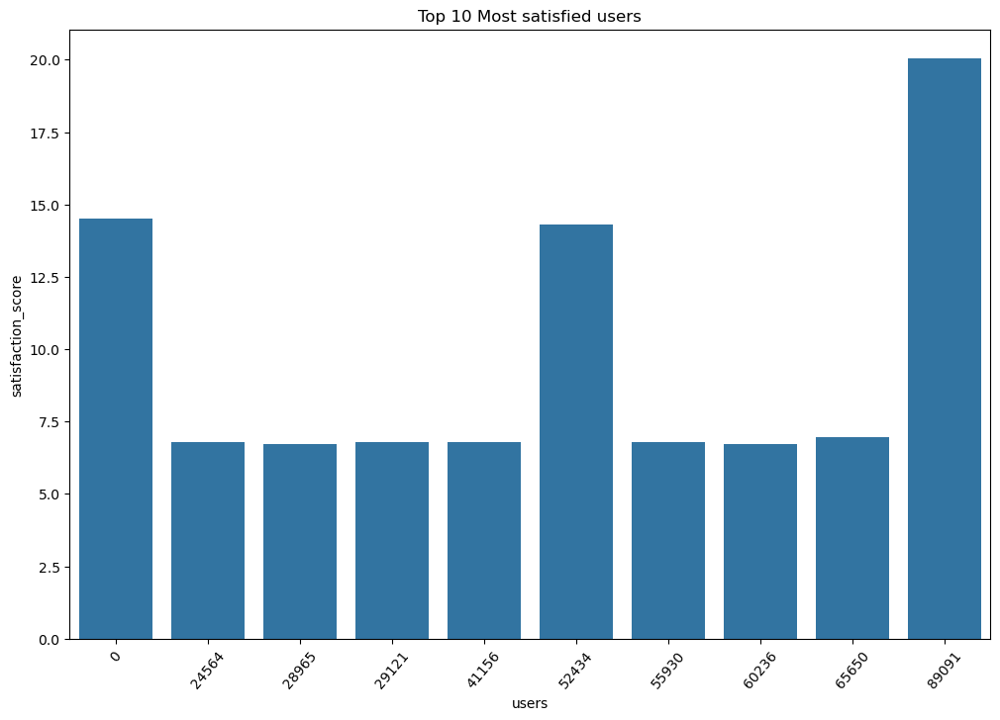

In [165]:
a = avg_score_df.sort_values(by = 'satisfaction_score', ascending = False).head(10)
plt.figure(figsize = (12,8))
plt.xticks(rotation = 50)
sns.barplot(x = a.index ,y = a['satisfaction_score']).set(title = 'Top 10 Most satisfied users', xlabel = 'users')

### Run a regression model of your choice to predict the satisfaction score of a customer. 
Working with the 4 features from the average_score df

In [166]:
all_variables = avg_score_df[['MSISDN/Number','engagement_score', 'experience_score', 'satisfaction_score']]
all_variables.head()

,MSISDN/Number,engagement_score,experience_score,satisfaction_score
0,3.360416e+10,11.436165,17.556220,14.496192
1,3.360417e+10,1.367844,0.386579,0.877211
2,3.360417e+10,0.102609,6.185919,3.144264
3,3.360418e+10,0.605355,0.666153,0.635754
4,3.360418e+10,1.971276,0.833075,1.402176


In [167]:
# split  dataset into train and test sets
from sklearn.model_selection import train_test_split

x = all_variables.drop(['satisfaction_score'], axis = 1)
y = all_variables[['satisfaction_score']]
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = .3, random_state = 0)
print('xtrain shape:', x_train.shape)
print('xtest shape:', x_test.shape)
print('ytrain shape:', y_train.shape)
print('ytest shape:', y_test.shape)

xtrain shape: (62364, 3)
xtest shape: (26728, 3)
ytrain shape: (62364, 1)
ytest shape: (26728, 1)


In [168]:
# drop the user column from the xtrain. Save it in another df from the xtest set
x_train = x_train.drop(['MSISDN/Number'], axis = 1)
test_user = x_test[['MSISDN/Number']]
x_test = x_test.drop(['MSISDN/Number'], axis = 1)
print('xtrain shape:', x_train.shape)
print('xtest shape:', x_test.shape)
print('users df shape:', test_user.shape)

xtrain shape: (62364, 2)
xtest shape: (26728, 2)
users df shape: (26728, 1)


In [169]:
# Models hyperparameters tuning
# I intend to observe the performance of 3 models (2 boosters and one ensemble method) then use the one with the lowest MSE score to predict the x_test set.

# Random Forest
regressor = RandomForestRegressor(n_estimators=300, random_state=0)


#gradboost
gdb = GradientBoostingRegressor(n_estimators=2000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =0)


#xgboost
xgb = XGBRegressor(colsample_bytree=0.4603, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=0,
                             random_state =0, nthread = -1)



In [170]:
# rf prediction
regressor.fit(x_train.values, y_train)
rf_pred = regressor.predict(x_test.values)

In [171]:
# xgb prediction
xgb.fit(x_train.values, y_train)
xgb_pred = xgb.predict(x_test.values)

[15:19:24] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [172]:
# gdb prediction
gdb.fit(x_train.values, y_train)
gdb_pred = gdb.predict(x_test.values)

In [173]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

print("Mean absolute error for random forest on test data =", mean_absolute_error(y_test, rf_pred))
print("Mean absolute error for xgboost on test data=", mean_absolute_error(y_test, xgb_pred))
print("Mean absolute error for gradboost on test data=", mean_absolute_error(y_test, gdb_pred))

print("\nMean squared error for random forest on test data =", mean_squared_error(y_test, rf_pred))
print("Mean squared error for xgboost on test data=", mean_squared_error(y_test, xgb_pred))
print("Mean squared error for gradboost on test data=", mean_squared_error(y_test, gdb_pred))

Mean absolute error for random forest on test data = 0.00245974360343038
Mean absolute error for xgboost on test data= 0.004890753421932459
Mean absolute error for gradboost on test data= 0.007496087295025149

Mean squared error for random forest on test data = 3.998675473481072e-05
Mean squared error for xgboost on test data= 4.909050403512083e-05
Mean squared error for gradboost on test data= 0.00012878350492911565


Working with the randomforest predictions since it has the smallest mean squared error.

In [174]:
# save predictions.
predictions = pd.DataFrame()
predictions['users'] = test_user['MSISDN/Number']
predictions['satisfaction_score'] = rf_pred
print(predictions.shape)
predictions.head()

(26728, 2)


,users,satisfaction_score
13034,3.362743e+10,1.140021
18871,3.364273e+10,3.985178
13080,3.362751e+10,0.629758
50846,3.366329e+10,2.591876
50301,3.366315e+10,1.269643


### Run a k-means (k=2) on the engagement & the experience score. 

In [175]:
ds = avg_score_df[['MSISDN/Number', 'engagement_score', 'experience_score']]

# no need for standardization (same unit if measurement)
k_means = KMeans(n_clusters = 2, init = 'k-means++', random_state = 0)
k_means.fit(ds)
clusters=k_means.predict(ds)

ds['clusters'] = clusters
ds.tail()

,MSISDN/Number,engagement_score,experience_score,clusters
89087,3.370000e+10,0.383019,1.892663,0
89088,3.370000e+10,3.112273,3.844082,0
89089,3.370000e+10,1.343179,5.386340,0
89090,3.370000e+10,0.925276,1.892663,0
89091,3.373042e+10,16.064821,24.025379,0


### Aggregate the average engagement & experience score per cluster.

In [176]:
cluster_agg = ds.groupby('clusters').agg({'experience_score':'mean', 'engagement_score':'mean'})
cluster_agg

,experience_score,engagement_score
clusters,,
0,3.268093,1.252460
1,2.688204,1.297889


###  Export your final table containing all user id + engagement, experience & satisfaction scores in your local MySQL database. Report a screenshot of a select on the exported table. 

In [177]:
df['MSISDN/Number'].nunique()

89092

In [178]:
df = avg_score_df[['MSISDN/Number', 'engagement_score', 'experience_score', 'satisfaction_score']]
df.to_csv('finaldf.csv')
print(df.shape)
df.head(2)

(89092, 4)


,MSISDN/Number,engagement_score,experience_score,satisfaction_score
0,3.360416e+10,11.436165,17.556220,14.496192
1,3.360417e+10,1.367844,0.386579,0.877211


In [179]:
from sqlalchemy import create_engine

# Define SQL Server connection details
server = 'DESKTOP-C0AD1DA\SQLEXPRESS'   # The name of your server
database = 'master'  # The database you want to connect to

# Create a connection string with a trusted connection
connection_url = f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&trusted_connection=yes"

# Create an engine
engine = create_engine(connection_url)

# Transfer data to SQL Server
table_name = 'finaldf'
df.to_sql(table_name, engine, if_exists='replace', index=False)

# Confirm completion
print(f"Dataset transferred to SQL Server table: {table_name}")

# Dispose the engine
engine.dispose()

Dataset transferred to SQL Server table: finaldf


[Back to top](#Table-of-Contents)